LivestockFish_FoodSupplyQuantity

# Pre-Load

### Libraries and Settings

In [1]:
import requests
import urllib.request, urllib.parse, urllib.error
from bs4 import BeautifulSoup

import re
import os
import time
import datetime
import chardet
import zipfile
import json
from IPython.display import display

import matplotlib.pyplot as plt
import matplotlib.transforms
import seaborn as sns
import folium
from PIL import Image
%matplotlib inline

import numpy as np
import pandas as pd
pd.set_option('precision', 4)
pd.set_option('display.max_rows',500)
pd.set_option('display.max_columns',500)
pd.set_option('max_colwidth',1000)

def curl(url,fname,mode='wb'):
    response = urllib.request.urlopen(url).read()
    with open(fname, mode) as handle:
        handle.write(response)

### Variables

In [2]:
# 以下用于临时变量名 ======================================================================

# data -- 用于创建表格的临时数据，创建完后必须赋值给永久变量
# df   -- 用于画图的临时数据，画图时将所需数据赋值给它
# dfs  -- 用于画图的临时数据字典，画图时将所需数据赋值给它
# domain
# 其他小写字母

# 初始化全局变量，请小心操作 ===================================================

# 用户自定义参数，会随着用户设置的变化而变化
D = ''    # Domain
A = ''    # Area     单一的国家/地区，
G = ''    # Group    地区组合
E = ''    # Element
Is = {}   # Items
IsGroup = [] # Items group, in Is.keys()

# 根据用户变量生成的常量
DFs = {}        # 每个 Domain 的所有数据是一份 DF，keys=Domains，no index, columns=['Area Code', 'Area', 'Element', 'Item', 'Year', 'Unit', 'Value']
CDTs = {}       # 从DFs筛选数据的条件，key0=Domain, key1=Area, key2=Element, value=Items
PVs = {}        # 从DFs根据筛选条件生成的 DICT, key0=Domain, key1=Area, key2=Element, key3=Items, values=DF, index=Areas, columns=Years

Years = []      # 年份列表

PVs_AG = {}     # 某国家地区与其所在组合的某些 Items 的比较，key0=Domain, key1=Area, key2=Element, key3=[AG, A, G], index=Years, columns=[C,G]

# 目录常量
ROOT = './data/FAO/'
DATA_DIR = ROOT

# 必要信息常量 
DOMs = {}        # Domain 的描述字典， key=domain_name(file name's pref)
LIST_country=[]     # 国家级地区列表，Area Code < 5000
LIST_group=[]    # 地区组合列表，Area Code >= 5000
COUNT_country=0  # 国家级地区的数量
COUNT_group=0    # 地区组合的数量

### Meta Data

In [3]:
# 加载 Domain 字典
datasets = 'datasets_E.xml'
path = ROOT + datasets

with open(path, 'rb') as handle:
    xml = handle.read()
    soup = BeautifulSoup(xml, 'xml')

for dataset in soup.find_all('Dataset'):
    loc = dataset.FileLocation.string
    domain = loc[loc.find('bulkdownloads/')+len('bulkdownloads/'):loc.find('_E_All')]
    DOMs[domain] = {'DatasetCode': dataset.DatasetCode.string,
                    'DatasetName': dataset.DatasetName.string,
                    'Topic': dataset.Topic.string,
                    'DatasetDescription': dataset.DatasetDescription.string,
                    'MedaData': [dataset.Contact.string, dataset.Email.string, dataset.DateUpdate.string, dataset.CompressionFormat.string, dataset.FileType.string, dataset.FileSize.string, dataset.FileRows.string],
                    'Url_Normalized':dataset.FileLocation.string}

# 加载单一国家地区列表
with open(ROOT+'list_country.docx', 'r') as handle:
    for line in handle.readlines():
        line=line.strip('\n')
        LIST_country.append(line)
LIST_country.remove('China')
COUNT_country = len(LIST_country)
print('There are {} countries.'.format(COUNT_country))
# display(LIST_country)

# 加载国家地区组合列表
with open(ROOT+'list_group.docx', 'r') as handle:
    for line in handle.readlines():
        line=line.strip('\n')
        LIST_group.append(line)
COUNT_group = len(LIST_group)
print('There are {} groups.'.format(COUNT_group))
# display(LIST_country)

There are 225 countries.
There are 34 groups.


### Plot Style

In [4]:
plt.style.use(['ggplot'])

# font size
TIT_size = 14    # titles
LAB_size = 10    # labels
LEG_size = 10    # legends
TCK_size = 10    # ticklabels

LIN_wei = 1.5    # line weights
BAR_wid = 6      # bar width
GRD_wid = 0.5    # grid line width
GRD_clr = 'white' 
GRD_aph = 1     # grid alpha

CLs = ('hotpink','maroon','orangered','gold','deepskyblue','yellowgreen','darkgray','chocolate',
       'r','orange','maroon','hotpink','b','yellowgreen','deepskyblue','g','c','lightslategray','k')
MKs = ('o', 'x','o','x', 'v','.','v','.','o','x','o', 'x', 'v','.','v','.')
LSs = ('-','-','--', ':', ':','-.','-.','-','-','--','--', ':', ':','-.','-.')

# =============================================================================================================
def setX_quant(ax, ticks, step, label = ''):
    ax.set_xticks(ticks)
    ax.set_xlim(ticks[0]-step,ticks[-1]+step)
    ax.set_xticklabels(ticks, rotation=0, ha='center', fontsize=TCK_size)
    ax.set_xlabel(label, fontsize=LAB_size)
    ax.xaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)
    
def setX_quali(ax, ticks, label = ''):
    ax.set_xticklabels(ticks, rotation=90, ha='center', fontsize=TCK_size)
    ax.set_xlabel(label, fontsize=LAB_size)
    ax.xaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)

def setY_quant(ax, y_max, label = ''):
    tick_num = 9
    step = y_max/(tick_num-1)
    min_gap = 10
    
    if step < 1:
        step = round(step,1)
        dec=1
    elif step < 10:
        step = int(step)
        dec=0
    elif step/min_gap < 10:
        step = int(step/min_gap)*10
        dec=0
    else:
        n=0
        while step/min_gap >= 10:
            step = int(step/min_gap)
            n += 1
        step = int(step/min_gap)*(min_gap**(n+1))
        dec=0
        
    y_max = step*(tick_num+1)        
    ticks = np.round(np.arange(0, y_max+step, step),decimals=dec)
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1]+step)
    ax.set_yticklabels(ticks, fontsize=TCK_size)
    ax.set_ylabel(label, fontsize=LAB_size)    
    ax.yaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)
    
def setY_per(ax):
    ticks=np.round(np.linspace(0, 100, num=11, endpoint=True), decimals=0)
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1])
    ax.set_yticklabels(ticks, fontsize=TCK_size)
    ax.set_ylabel('Percentage (%)', fontsize=LAB_size)
    ax.yaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)

# Part 1

## Setting Variables

### Domain Selection - 'Production_LivestockPrimary'

In [7]:
def rdDF(domain):
    display(DOMs[domain])
    path_csv = DATA_DIR+domain+'.csv'
    
    data = pd.read_csv(path_csv)
    
#     display(data.head())
#     display(data.tail())
    print(data.shape)
    return data

In [8]:
# 给Domain赋值
D = 'FoodSupply_LivestockFish'

data = rdDF(D)

{'DatasetCode': 'CL',
 'DatasetName': 'Food Balance: Food Supply - Livestock and Fish Primary Equivalent',
 'Topic': 'Most crop and livestock products, including processed products, under agricultural activity.',
 'DatasetDescription': 'Food supply data is some of the most important data in FAOSTAT. In fact, this data is for the basis for estimation of global and national undernourishment assessment, when it is combined with parameters and other data sets. This data has been the foundation of food balance sheets ever since they were first constructed. The data is accessed by both business and governments for economic analysis and policy setting, as well as being used by the academic community.',
 'MedaData': ['Mr. Salar Tayyib',
  'faostat@fao.org',
  '2018-01-17',
  'zip',
  'csv',
  '13789KB',
  '2029430'],
 'Url_Normalized': 'http://fenixservices.fao.org/faostat/static/bulkdownloads/FoodSupply_LivestockFish_E_All_Data_(Normalized).zip'}

(2029430, 7)


### Optimize Format, Drop Nan, Drop Duplicates

In [9]:
DFs[D] = data.dropna().drop_duplicates()
DFs[D].shape

(1907344, 7)

### Show Years Range

In [10]:
Years = DFs[D]['Year'].unique()
Years

array([1961, 1962, 1963, 1964, 1965, 1966, 1967, 1968, 1969, 1970, 1971,
       1972, 1973, 1974, 1975, 1976, 1977, 1978, 1979, 1980, 1981, 1982,
       1983, 1984, 1985, 1986, 1987, 1988, 1989, 1990, 1991, 1992, 1993,
       1994, 1995, 1996, 1997, 1998, 1999, 2000, 2001, 2002, 2003, 2004,
       2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013])

### Area Selection

In [11]:
# 给 Area 赋值
A = 'China, mainland'

data = DFs[D][DFs[D]['Area']==A]

# display(data.groupby(['Element','Item']).count())
display('Elements:', data.Element.unique())
display('Items:', data.Item.unique())

'Elements:'

array(['Food supply quantity (tonnes)',
       'Food supply quantity (g/capita/day)',
       'Food supply quantity (kg/capita/yr)',
       'Food supply (kcal/capita/day)',
       'Protein supply quantity (g/capita/day)',
       'Fat supply quantity (g/capita/day)'], dtype=object)

'Items:'

array(['Aquatic Animals, Others', 'Aquatic Plants', 'Bovine Meat',
       'Butter, Ghee', 'Cephalopods', 'Cheese', 'Cream', 'Crustaceans',
       'Demersal Fish', 'Eggs', 'Fats, Animals, Raw', 'Fish, Body Oil',
       'Fish, Liver Oil', 'Freshwater Fish', 'Honey',
       'Marine Fish, Other', 'Meat, Other', 'Milk - Excluding Butter',
       'Milk, Whole', 'Molluscs, Other', 'Mutton & Goat Meat',
       'Offals, Edible', 'Pelagic Fish', 'Pigmeat', 'Poultry Meat',
       'Animal fats', 'Animal Products', 'Aquatic Products, Other',
       'Fish, Seafood', 'Meat', 'Offals', 'Grand Total'], dtype=object)

### Element and Items Selection

In [12]:
def mkPV_Item_Year( domain, area, element):   
    df = DFs[domain]
    df = df[(df['Area']==area) & (df['Element']==element)]
    df = pd.pivot_table(df,index=['Item'],columns=['Year'],values=['Value'])
    df.columns.set_names([None, None], inplace=True)    # reset mult-index name 
    df.columns = df.columns.get_level_values(-1)        # flat the multi-index by the last element of each index tuple.
    pivot = df
    return pivot  

def mkPV_Element_Year( domain, area, item):   
    df = DFs[domain]
    df = df[(df['Area']==area) & (df['Item']==item)]
    df = pd.pivot_table(df,index=['Element'],columns=['Year'],values=['Value'])
    df.columns.set_names([None, None], inplace=True)    # reset mult-index name 
    df.columns = df.columns.get_level_values(-1)        # flat the multi-index by the last element of each index tuple.
    pivot = df
    return pivot 

In [13]:
# 用于单项测试，空值可跳过
E = ''

I = ''

pivot=pd.DataFrame()
if E != '': pivot = mkPV_Item_Year(D, A, E)
if I != '': pivot = mkPV_Element_Year(D, A, I)
if pivot.shape==(0,0):pass
else:
    pivot.sort_values(Years[-1], axis=0, ascending = False, inplace = True)

    rankings={}
    for i in pivot.index.values:
        ranks=np.array([])
        for y in pivot.columns:
            pivot.sort_values(y, axis=0, ascending = False, inplace = True)
            rank = pivot.index.tolist().index(i)
            ranks = np.append(ranks,rank)
        rankings[i]=ranks

    fig = plt.figure(figsize = (16,8))
    plt.title('Rankings of All Items')
    n=0
    lines = LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs+LSs
    colors = CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs+CLs
    for i in pivot.index.values:
        plt.plot(pivot.columns, rankings[i],color=colors[n], linestyle=lines[n])
        n+=1
    plt.legend(labels=pivot.index.values,loc='lower center',bbox_to_anchor=(1.1,0),borderaxespad = 0.)
    ax = plt.gca().invert_yaxis()

#### Explorded Classification of Items

##### FoodSupply_LivestockFish

    'Grand Total':['Animal Products', 'Aquatic Plants'],
    'Animal Products':['Meat','Fish, Seafood','Milk - Excluding Butter','Eggs','Offals','Animal fats'],
    'Meat': ['Poultry Meat', 'Pigmeat','Bovine Meat','Mutton & Goat Meat','Meat, Other'],
    'Fish, Seafood':['Freshwater Fish','Molluscs, Other', 'Crustaceans','Cephalopods','Demersal Fish','Pelagic Fish','Marine Fish, Other'],
    'Milk - Excluding Butter':[],
    'Eggs':[],
    'Offals':[],
    'Animal fats':[],


In [13]:
# 给 Elements 赋值
E = 'Food supply quantity (tonnes)'
# 给 Items 赋值
Is = {
    'Grand Total':['Grand Total','Animal Products'],
#   动物产品（未包含蜂蜜）
    'Animal Products':['Meat','Fish, Seafood','Eggs','Milk - Excluding Butter','Offals','Animal fats'],
#   畜禽肉
    'Meat': ['Pigmeat','Bovine Meat','Mutton & Goat Meat','Poultry Meat', 'Meat, Other'],
    'Pigmeat':[],
    'Bovine Meat':[],
    'Mutton & Goat Meat':[],
    'Poultry Meat':[], 
#   水产
    'Fish, Seafood':[],
#   蛋类
    'Eggs':[],
#   奶类
    'Milk - Excluding Butter':[],
}

data = data[(data['Element']==E) & (data['Item'].isin(Is))]

# display(data.head(2))
# display(data.tail(2))

# display(data.groupby(['Item']).count())
# display(data.groupby(['Unit']).count())                   # 查看单位

# 生成成条件
CDTs[D] ={}
CDTs[D][A] ={}
CDTs[D][A][E] = Is
display(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

{'FoodSupply_LivestockFish': {'China, mainland': {'Food supply quantity (tonnes)': {'Grand Total': ['Grand Total',
     'Animal Products'],
    'Animal Products': ['Meat',
     'Fish, Seafood',
     'Eggs',
     'Milk - Excluding Butter',
     'Offals',
     'Animal fats'],
    'Meat': ['Pigmeat',
     'Bovine Meat',
     'Mutton & Goat Meat',
     'Poultry Meat',
     'Meat, Other'],
    'Pigmeat': [],
    'Bovine Meat': [],
    'Mutton & Goat Meat': [],
    'Poultry Meat': [],
    'Fish, Seafood': [],
    'Eggs': [],
    'Milk - Excluding Butter': []}}}}

['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


In [14]:
def ranking_ItemInArea(
    domain,
    area,
    element,
    items_groups=[],
):
#     如果不设置items_groups，那么 items 仅包含 Is 的末梢，即值为空的键
    if items_groups==[]: items = ITEMs       
#     否则，items会包含 Is 中键为 items_groups 中的 item，以及所有的末梢，最后取其的 set 去掉重复元素
    else:
        items = []
        for i in CDTs[domain][area][element]:
            items.append(i)
        for g in items_groups:
            for i in CDTs[domain][area][element][g]:
                items.append(i)
        items = list(set(items))
    
    pivot = mkPV_Item_Year(domain=domain,area=area,element=element).copy()
    
    rankings = {}
    for i in items:
        if i in pivot.index:
            ranks=np.array([])
            for y in Years:
                pivot.sort_values(y, axis=0, ascending = False, inplace = True)
                rank = pivot.index.tolist().index(i)
                ranks = np.append(ranks,rank+1)
            rankings[i]=ranks
    
    df_rank = pd.DataFrame(rankings)
    df_rank.index=Years

#     fig = plt.figure(figsize = (16,8))
#     plt.title('Rankings of Main Items in {}'.format(area))
    
#     n=0
#     lines = LSs+LSs
#     colors = CLs+CLs
#     for i in df_rank.columns.values:
#         plt.plot(Years, rankings[i], color=colors[n], linestyle=lines[n])
#         n+=1
#     plt.legend(labels=df_rank.columns,loc='lower center',bbox_to_anchor=(1.1,0),borderaxespad = 0.)
#     ax = plt.gca().invert_yaxis()
    
    return list(df_rank.columns)

In [15]:
# 设置 items group, 自动生成 ITEMs_all, ITEMs
IsGroup = ['Animal Products', 'Meat']

ITEMs_all = ranking_ItemInArea(D,A,E,items_groups=IsGroup)
print(ITEMs_all)

items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

['Pigmeat', 'Animal fats', 'Meat', 'Poultry Meat', 'Offals', 'Eggs', 'Meat, Other', 'Milk - Excluding Butter', 'Bovine Meat', 'Mutton & Goat Meat', 'Fish, Seafood']
['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


### Create Pivots for Items

In [16]:
def mkPVs_Area_Year(
    domain,
    area,
    element,
    items_groups=[],
):
    
#     如果不设置items_groups，那么 items 仅包含 Is 的末梢，即值为空的键
    if items_groups==[]: items = ITEMs                
#     否则，items会包含 Is 中键为 items_groups 中的 item，以及所有的末梢，最后取其的 set 去掉重复元素
    else:
        items = []
        for i in CDTs[domain][area][element]:
            items.append(i)
        for g in items_groups:
            for i in CDTs[domain][area][element][g]:
                items.append(i)
        items = list(set(items))
    
    df = DFs[domain].copy()
    
    dfs = {}
    for i in items:
        dfs[i] = df[(df['Element']==element) & (df['Item']==i)][['Area','Year','Value']]

    pivots = {}
    for i in items:
        df = pd.pivot_table(dfs[i],index=['Area'],columns=['Year'],values=['Value'])
        df.columns.set_names([None, None], inplace=True)    # reset mult-index name 
        df.columns = df.columns.get_level_values(-1)        # flat the multi-index by the last element of each index tuple.
        if df.shape != (0, 0):
            pivots[i] = df
    return pivots

In [17]:
PVs[D]={}
PVs[D][A]={}
PVs[D][A][E] = mkPVs_Area_Year(D, A, E, IsGroup)

# for i, pv in PVs[D][A][E].items():
#     #         print(Unit)
#     display(E, i, pv.tail(2))

## Results

### 1. An Area's Word Ranking of Some Items

In [18]:
def ranking_AreaItemInWorld(
    domain,
    area,
    element,
    items_group='',
    items=[],
    area_list=LIST_country,
    rank_max=150,
    fig_size=(6,4),
    colors=[],
):  
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
        
    dfs = PVs[domain][area][element]
    
    rankings = {}
    rank_maxes=np.array([])
    for i in items:
        if i in dfs.keys():
            df = dfs[i].copy()
            ranks = np.array([])
            try: 
                df_areas = df[df.index.isin(area_list)]
                for year in df_areas.columns:
                    rank = df_areas.sort_values(year, ascending=False).index.tolist().index(area)+1
                    ranks = np.append(ranks,rank)
                rankings[i]=ranks
                rank_maxes = np.append(rank_maxes, np.array(ranks).max())
            except:continue
    df_rank = pd.DataFrame(rankings)
    df_rank = df_rank.transpose()
    df_rank.columns = Years
    display(df_rank[[Years[0],Years[-1]]])
    
    if colors==[]: colors=CLs
    else: colors=colors
    
    # =========================================
    fig = plt.figure(figsize = fig_size,dpi=300)
    plt.title("World Ranking of {}: {}".format(element, area), fontsize=TIT_size)
    X_step=5
    
    n=0
    for i in rankings.keys():
        plt.plot(Years[::X_step], rankings[i][::X_step], color=colors[n], linestyle=':', marker='o', linewidth=3, alpha=1)
        n+=1
        
    ax = plt.gca()
    ax.legend(labels=rankings.keys(),fontsize=LEG_size,frameon=False,
             loc='center left',bbox_to_anchor=(1.0,0.5),borderaxespad = 0.)

    setX_quant(ax, Years[::X_step], X_step)
    step=10
    y_max = rank_max      
    ticks = range(0, y_max+step, step)
    ax.set_yticks(ticks)
    ax.set_ylim(ticks[0],ticks[-1]+step)
    ax.set_yticklabels(ticks, fontsize=TCK_size)
    ax.set_ylabel('Rankings', fontsize=LAB_size)    
    ax.yaxis.grid(True, linewidth=GRD_wid, color=GRD_clr, alpha=GRD_aph)
    
    ax = plt.gca().invert_yaxis()
    
    img='./results/img/FAO_LivestockFish_FoodSupplyQuantity/FAO_{}_{}_Ranking.png'.format(domain.title(), element[:element.find('/')].title())
    bbox = matplotlib.transforms.Bbox([[-1, -0], [12, 8]])
    fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

,1961,2013
Pigmeat,4.0,1.0
Bovine Meat,53.0,3.0
Mutton & Goat Meat,15.0,1.0
Poultry Meat,3.0,1.0
"Fish, Seafood",3.0,1.0
Eggs,3.0,1.0
Milk - Excluding Butter,26.0,3.0


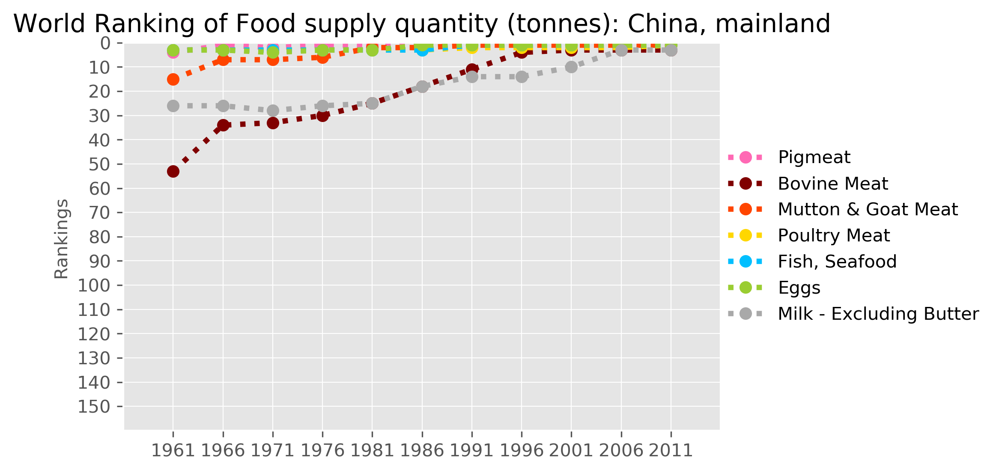

In [19]:
# 根据需要设置items和颜色
ranking_AreaItemInWorld(D,A,E,rank_max=150)

### 2. An Area's Main Items and Trends

In [22]:
def plotTrends(
    domain,
    area, 
    element, 
    items_group='',
    items=[],
    toUnit='',   
    changeUnit = 1,             # 单位转换，值变为原来的多少倍
    fig_size = (14, 7),
    colors=CLs,
    stacked=True,
):
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
        
    print('items =', items)

    df = DFs[domain][(DFs[domain]['Area']==area)\
                   & (DFs[domain]['Element']==element)\
                   & (DFs[domain]['Item'].isin(items))].dropna().drop_duplicates().copy()

    dfs = {}
    for i in items:
        dfs[i] = df[df['Item']==i][['Year','Value']].fillna(0)
        dfs[i]['Value'] = dfs[i]['Value']*changeUnit
        dfs[i]=dfs[i].set_index('Year')
        
    df_concat = pd.DataFrame()
    for i in items:
        df_concat = pd.concat([df_concat, dfs[i]], axis=1)
    df_concat.columns=items
    df_concat['Sum'] = df_concat.apply(lambda x: x.sum(), axis=1)

#         print(Unit)
    display(df_concat[items].tail())
    
    X_step=5
    X_ticks=Years[::X_step]
    
    if toUnit=='': Y_label = element
    else: 
        if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
        else:Y_label=element+' ({})'.format(toUnit)

    if stacked==False:
        fig = plt.figure(figsize=(7,4),dpi=300)
        df_concat[items].plot.area(color=colors, stacked=False, alpha=0.4, ax=plt.gca())
        Y_max = df_concat[items].values.max()
        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False,)
        setX_quant(ax, X_ticks, X_step)
        setY_quant(ax, Y_max, Y_label)
        
        img='./results/img/FAO_{}_{}_Trends_{}.png'.format(domain, element[:element.find('/')],items_group)
        bbox = matplotlib.transforms.Bbox([[-0, -0], [10, 5]])
        fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)
    
    else:
        fig = plt.figure(figsize = fig_size,dpi=300)
        fig.tight_layout()                          
        plt.subplots_adjust(wspace =0.2, hspace =0.11)
        plt.suptitle("\n\nTrends of{}{}: {}".format(' '+items_group+' ',element, area), fontsize=TIT_size)

        # ===================================================
        ax = fig.add_subplot(2,2,1)
        df_concat[items].plot.line(color=colors, ax=plt.gca())
        
        Y_max = df_concat[items].values.max()
        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False,
                 )
        setX_quant(ax, X_ticks, X_step)  
        setY_quant(ax, 1.5*Y_max, Y_label)

        # ===================================================
        ax = fig.add_subplot(2,2,2)
        df_concat[items].plot.area(color=colors, stacked=True, alpha=1, ax=plt.gca())

        Y_max = df_concat['Sum'].values.max()
        ax = plt.gca()
        ax.legend(fontsize=LEG_size,frameon=False,
                 )
        setX_quant(ax, X_ticks, X_step)
        setY_quant(ax, 1.5*Y_max, Y_label)

        #====================================================
        ax = fig.add_subplot(2,2,3)
        for i in items:
            df_concat[i]=df_concat[i]/df_concat['Sum']*100
        df_concat[items].plot.line(color=colors, ax=plt.gca())

        ax = plt.gca()
        ax.legend_.remove()
        setX_quant(ax, X_ticks, X_step)
        setY_per(ax)

        #====================================================
        ax = fig.add_subplot(2,2,4)
        df_concat[items].plot.area(color=colors, stacked=True, alpha=1, ax=plt.gca())

        ax = plt.gca()
        ax.legend_.remove()
        setX_quant(ax, X_ticks, X_step)
        setY_per(ax)

        img='./results/img/FAO_LivestockFish_FoodSupplyQuantity/FAO_{}_{}_Trends_{}.png'.format(domain, element[:element.find('/')],items_group)
        bbox = matplotlib.transforms.Bbox([[-0, -0], list(fig_size)])
        fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,4686.3042,628.8898,389.5434,1631.1380,4212.8702,2477.6477,3944.2715
2010,4856.2794,651.6082,403.2487,1661.0319,4372.5062,2498.1866,4158.3198
2011,4875.0089,644.2805,400.6026,1695.5527,4496.3090,2543.6109,4252.2840
2012,5172.3603,660.6176,412.8895,1799.9097,4775.3615,2584.6144,4470.6108
2013,5324.7024,708.9479,433.6508,1828.3598,4775.3615,2599.9089,4525.2209


items = ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats']


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,7485.5192,4212.8702,2477.6477,3944.2715,404.9435,264.1225
2010,7729.4549,4372.5062,2498.1866,4158.3198,456.6968,269.8496
2011,7779.1963,4496.3090,2543.6109,4252.2840,469.7771,286.1194
2012,8209.4421,4775.3615,2584.6144,4470.6108,471.2595,287.1268
2013,8459.1307,4775.3615,2599.9089,4525.2209,477.0810,277.5004


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Meat, Other"
Year,,,,,
2009,4686.3042,628.8898,389.5434,1631.1380,149.6438
2010,4856.2794,651.6082,403.2487,1661.0319,157.2866
2011,4875.0089,644.2805,400.6026,1695.5527,163.7515
2012,5172.3603,660.6176,412.8895,1799.9097,163.6650
2013,5324.7024,708.9479,433.6508,1828.3598,163.4697


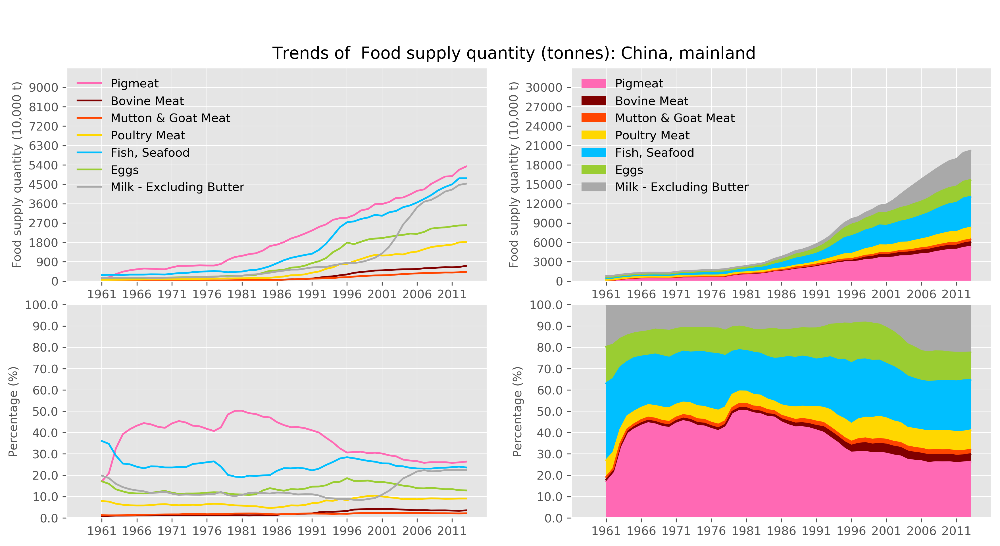

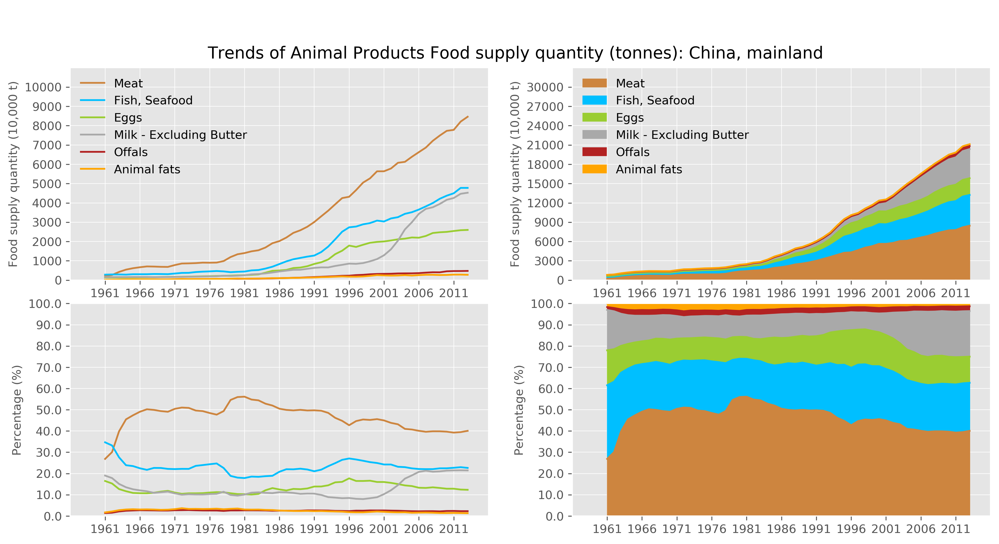

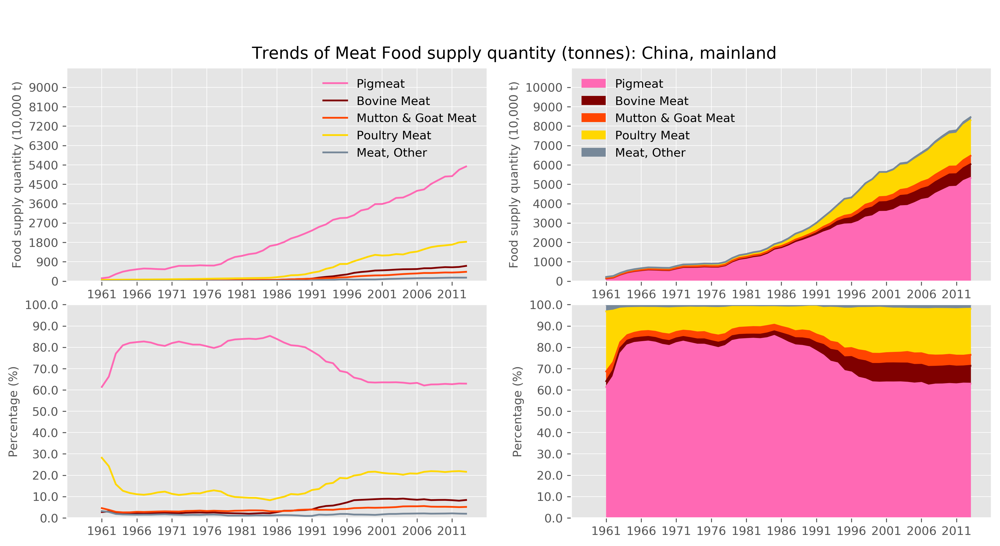

In [21]:
# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E, toUnit='10,000 t', changeUnit = 1/10000)

# 设置颜色
cmeat,cfish,cegg,cmilk,coffal,cfat=\
'peru','deepskyblue','yellowgreen','darkgray','firebrick','orange'
cpig,ccattle,cgoat,cbirds,cother=\
'hotpink','maroon','orangered','gold','lightslategray'

# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           toUnit='10,000 t', changeUnit = 1/10000,
           colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
          )
plotTrends(D, A, E, items_group='Meat', 
           toUnit='10,000 t', changeUnit = 1/10000,
           colors=[cpig,ccattle,cgoat,cbirds,cother],
          )

### 3. World Map of Some Items in Some Years

In [23]:
def mkDataMaps(
    domain,
    area,
    element,
    items_group='',
    items=[],
    group='World',
    toUnit='',
    changeUnit=1,
): 
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
            
    years = [Years[-1]-20,Years[-1]]
    
    if toUnit=='': Y_label = element
    else: 
        if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
        else: Y_label = element + ' ({})'.format(toUnit)

    
    dfs = PVs[domain][area][element]
    fig_size = (14,16)
    fig=plt.figure(figsize=fig_size,dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.6, hspace =1.0)
    plt.suptitle('{}: China, mainland Vs. Top5 in the World'.format(element), fontsize=TIT_size)
    n=0
    for i in items:
        df = dfs[i][dfs[i].index.isin(LIST_country)].copy()
        df = df*changeUnit
        df = df.fillna(0)
        
        df_area = df[df.index==area][years]
        df_top = df.sort_values([years[-1]],ascending=False)[years].head()
        if area in df_top.index:pass
        else: df_top = pd.concat([df_top,df_area],sort=False)
#         print(Unit)
        display(df_top)
        
        n+=1
        ax = fig.add_subplot(4,3,n)
        df_top.plot.bar(ax=plt.gca())
        ax=plt.gca()
        plt.title('{}: \n{} Vs. World'.format(i, area))
        plt.legend(loc='upper left',bbox_to_anchor=(1.,1.),borderaxespad = 0.)
        plt.xticks(rotation=30,ha='right',fontsize=TCK_size)
        plt.xlabel('')
        plt.yticks(fontsize=TCK_size)
        plt.ylabel(Y_label, fontsize=LAB_size)
        
        threshold_scale = np.linspace(df.values.min().min(),df.values.max(), 6, dtype=int).tolist()
        threshold_scale[-1] = threshold_scale[-1] + 1
        
        for y in years:
            legend = "{}, {}, {}".format(Y_label, i, y)
            
            world_map = folium.Map(
                width=1000,height=600,
                location=[10, 0], 
                zoom_start=2, 
                tiles='Mapbox Bright',
            )

            folium.Choropleth(
                geo_data= r'world_countries.json',
                data=df[y],
                columns=[df.index, 'Value'],
                key_on='feature.properties.name',   # must be 'feature', not 'features'
                threshold_scale=threshold_scale,
                fill_color='OrRd', 
                fill_opacity=0.9, 
                line_opacity=0.2,
                highlight=True,
                legend_name=legend,
                reset=False
            ).add_to(world_map)
            
            print(legend)
#             display(world_map)
            
    img='./results/img/FAO_LivestockFish_FoodSupplyQuantity/FAO_{}_{}_VsTop_{}.png'.format(domain, element[:element.find('/')],items_group)
    bbox = matplotlib.transforms.Bbox([[-2, -0], [20,20]])
    fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

,1993,2013
Area,,
"China, mainland",2636.4292,5324.7024
United States of America,786.8457,884.7117
Germany,440.1187,428.6422
Russian Federation,283.6605,366.4885
Viet Nam,85.8300,320.8609


Food supply quantity (10,000 t), Pigmeat, 1993
Food supply quantity (10,000 t), Pigmeat, 2013


,1993,2013
Area,,
United States of America,1101.6295,1159.8299
Brazil,439.4116,786.3343
"China, mainland",200.0616,708.9479
Russian Federation,400.1546,242.5306
Argentina,220.0218,229.9590


Food supply quantity (10,000 t), Bovine Meat, 1993
Food supply quantity (10,000 t), Bovine Meat, 2013


,1993,2013
Area,,
"China, mainland",137.1189,433.6508
India,62.5178,72.5228
Nigeria,18.1156,47.1941
Pakistan,59.4847,44.8375
Sudan,0.0000,37.6210


Food supply quantity (10,000 t), Mutton & Goat Meat, 1993
Food supply quantity (10,000 t), Mutton & Goat Meat, 2013


,1993,2013
Area,,
"China, mainland",572.1477,1828.3598
United States of America,1130.4099,1600.6094
Brazil,270.3753,901.6211
Russian Federation,145.5391,392.8126
Mexico,126.0750,368.5020


Food supply quantity (10,000 t), Poultry Meat, 1993
Food supply quantity (10,000 t), Poultry Meat, 2013


,1993,2013
Area,,
"China, mainland",1736.6646,4775.3615
Indonesia,311.5160,703.9343
United States of America,599.3714,688.3420
India,375.6137,631.0377
Japan,837.8838,617.9386


Food supply quantity (10,000 t), Fish, Seafood, 1993
Food supply quantity (10,000 t), Fish, Seafood, 2013


,1993,2013
Area,,
"China, mainland",1069.5691,2599.9089
United States of America,352.4278,466.7264
India,113.4478,323.0630
Japan,250.0022,243.4589
Mexico,107.1871,224.3044


Food supply quantity (10,000 t), Eggs, 1993
Food supply quantity (10,000 t), Eggs, 2013


,1993,2013
Area,,
India,5009.3576,10580.7187
United States of America,6701.6601,8151.2731
"China, mainland",658.0394,4525.2209
Pakistan,1449.6861,3335.6361
Brazil,1468.8164,2991.0035


Food supply quantity (10,000 t), Milk - Excluding Butter, 1993
Food supply quantity (10,000 t), Milk - Excluding Butter, 2013


,1993,2013
Area,,
"China, mainland",3596.4940,8459.1307
United States of America,3055.2814,3684.9039
Brazil,868.1930,1955.2001
Russian Federation,875.2579,1068.6529
Mexico,375.7201,761.2939


Food supply quantity (10,000 t), Meat, 1993
Food supply quantity (10,000 t), Meat, 2013


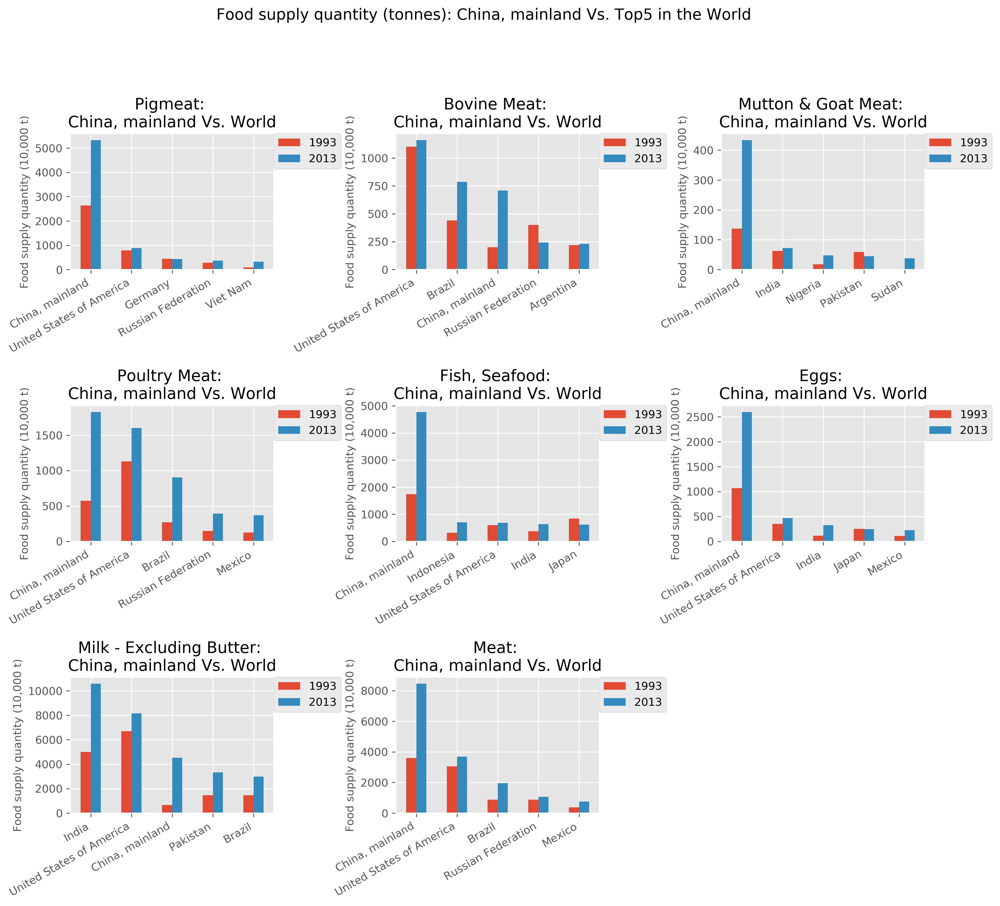

In [25]:
items=ITEMs.copy()
items.append('Meat')
mkDataMaps(D, A, E, items=items, toUnit='10,000 t', changeUnit=1/10000)

### 4. Main Contribution of an Area

In [26]:
# 设置主要贡献方面
ITEMs_main = ['Pigmeat', 'Fish, Seafood', 'Eggs']

In [27]:
def mkPVs_AG(
    domain,
    area,
    element,
    items_group='',
    items=[],
    group='World',
):
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    pivots={}
    n=0
    for i in items:
        n+=1
        pivots[i]=PVs[domain][area][element][i][PVs[domain][area][element][i].index.isin([area,group])].transpose().copy()
        pivots[i].index.names = ['Year']
#         print(i)
#         display(pivots[i].tail(2))
        
    pivot_A=pd.DataFrame()
    for i in items:
        pivot_A = pd.concat([pivot_A, pivots[i][area]], axis=1)
    pivot_A.columns=items
#     print(area)
#     display(pivot_A.tail(2))
        
    pivot_G=pd.DataFrame()
    for i in items:
        pivot_G = pd.concat([pivot_G, pivots[i][group]], axis=1)
    pivot_G.columns=items
#     print(group)
#     display(pivot_G.tail(2))

    pivots_AG={
        (area,group):pivots,
        area:pivot_A,
        group:pivot_G,
    }
    return pivots_AG

In [28]:
def proportion_AG(
    domain,
    area,
    element,
    items_group='',
    items=[],
    group='World',
    other='Other Areas',
    toUnit='',
    changeUnit=1,
    kind='area',
):        
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
        
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
    
    PVs_AG[domain]={}
    PVs_AG[domain][area]={}
    PVs_AG[domain][area][element]=mkPVs_AG(domain, area, element,items=items)

    fig_row=(len(items)+1)//2
    fig_size=(14,fig_row*4)
    
    if kind=='area':alpha=0.4
    else:alpha=1

    # ===========================================================
    fig = plt.figure(figsize = fig_size, dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.2, hspace =0.3)
    plt.suptitle("{}: {} Vs. {}".format(element, area, group), fontsize=TIT_size)
    
    n=0
    for i in items:
        n+=1
        ax = fig.add_subplot(fig_row,2,n)
        plt.title(i, fontsize=TIT_size)
        df = PVs_AG[domain][area][element][(area,group)][i].copy()
        df=df*changeUnit
        df.plot(kind=kind,stacked=False, alpha=alpha, ax=plt.gca())

        ax=plt.gca()
        ax.legend(fontsize=13, loc='upper left')

        X_step=5
        setX_quant(ax, Years[::X_step], X_step)

        Y_max=df.values.max()
        if toUnit=='': Y_label = element
        else: 
            if '(' in element: Y_label = element[:element.find('(')] + '({})'.format(toUnit)
            else:Y_label=element+' ({})'.format(toUnit)
        setY_quant(ax, 1.5*Y_max, Y_label)
    
    img='./results/img/FAO_LivestockFish_FoodSupplyQuantity/FAO_{}_{}_VsWorld_{}.png'.format(domain, element[:element.find('/')],items_group)
    bbox = matplotlib.transforms.Bbox([[-0, -0], list(fig_size)])
    fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

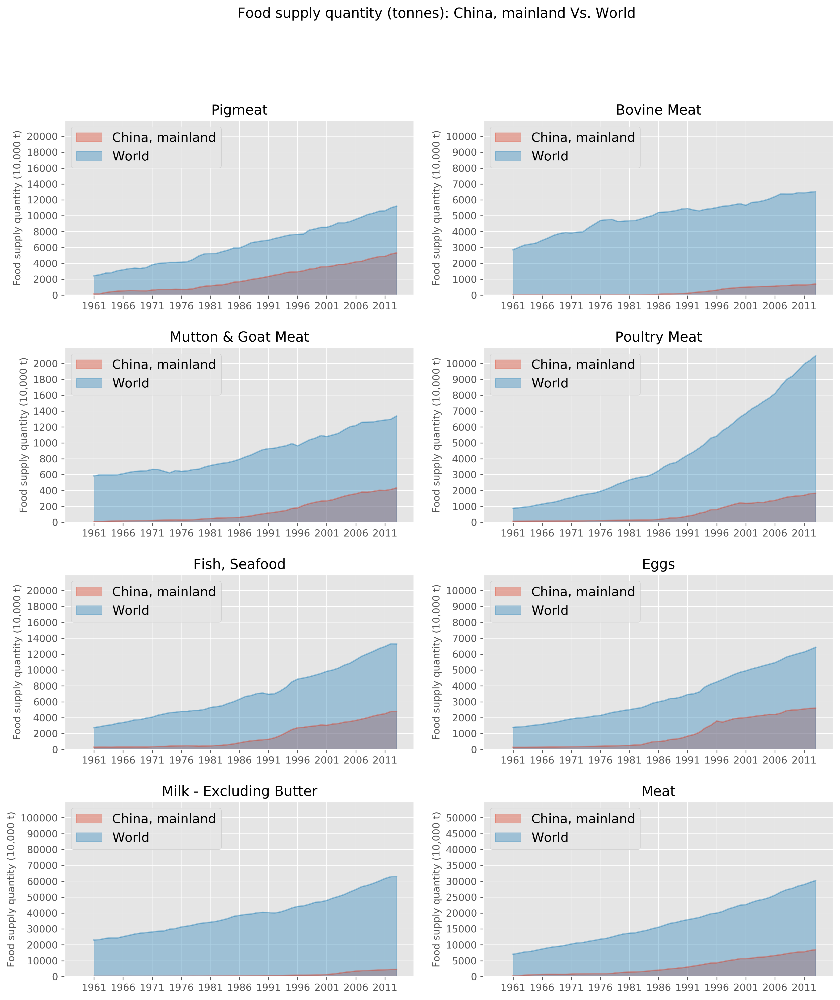

In [29]:
items = ITEMs.copy()
items.append('Meat')
proportion_AG(D,A,E, items=items, toUnit='10,000 t', changeUnit=1/10000, kind='area')

In [30]:
def pi_AG(
    domain,
    area,
    element,
    items_group='',
    items=[],
    years=[],
    group='World',
    other='Other Area',
    colors=[],
    fig_size=(14,7),
):
    if items_group=='' : 
        if items==[]: items=ITEMs.copy()
        else: items=items.copy()
    else:
        items_raw = CDTs[domain][area][element][items_group]
        items=[]
        for i in items_raw:
            if i in ITEMs_all:items.append(i)
                
    if years==[]: years=[Years[0],Years[-1]]
    
    if colors==[]: colors=CLs
    else: colors=colors
        
    # plot all items in the world...
    
    fig = plt.figure(figsize = fig_size,dpi=300)
    fig.tight_layout()                          
    plt.subplots_adjust(wspace =0.2, hspace =0.1)
    plt.suptitle("Percentages of {}'s Different Items\nand the Proportions of {} in the {}".format(element, area, group), fontsize=TIT_size)

    fig_no=0
    for y in years:
        fig_no+=1

        df=pd.concat([PVs_AG[domain][area][element][area].loc[y],
                      PVs_AG[domain][area][element][group].loc[y]],axis=1).copy()

        df=df[df.index.isin(items)]
        df.columns=[area,group]
        df[other] = df[group] - df[area]

        print(y)
#         print(Unit)
        display(df)

        ax = fig.add_subplot(1,2, fig_no)
        plt.title(y, fontsize=TIT_size)

        size = 0.5
        outer_radius = 2
        inner_colors = ['r', 'lightgray', 'r', 'lightgray', 'r', 'lightgray', 'r', 'lightgray']

        outer_explode = np.zeros(len(items))
        inner_explode = np.zeros(len(items*2))

        for n in range(len(items)):
            if items[n] in ITEMs_main:
                outer_explode[n] = 0.15
                inner_explode[2*n] = 0.15

        area_pct = ['{}{}'.format(int(df.loc[i][area]/df.loc[i][group]*100),'%') for i in df.index.values]
        inner_labels = []
        for i in area_pct:
            inner_labels.append(i)
            inner_labels.append('')

        fontsize = 14
        shadow = False
        startangle = 0
        plt.pie(df[group].values, 
                autopct='%1.0f%%',
                pctdistance=1.06,
                explode=list(outer_explode),
                radius=outer_radius, 
                colors=colors,
                center = (0,0),
                textprops = {'fontsize':fontsize}, 
                wedgeprops=dict(width=size),
                shadow=shadow,
                startangle=startangle,
                )
        plt.pie(df[[area,other]].values.flatten(), 
                labels=inner_labels,
                labeldistance = 0.8,
                explode=list(inner_explode),
                radius=outer_radius-size, 
                colors=inner_colors,
                center = (0,0),
                textprops = {'fontsize':fontsize}, 
                wedgeprops=dict(width=size),
                shadow=shadow,
                startangle=startangle,
               )
        plt.axis('equal')          # equal 使得为正圆

    ax=plt.gca()
    ax.legend(labels=list(df.index.values)+[area,other],frameon=False,fontsize=LEG_size, 
              loc='lower center',bbox_to_anchor=(-0.05,0.),borderaxespad = 0.)
    
    img='./results/img/FAO_LivestockFish_FoodSupplyQuantity/FAO_{}_{}_VsWorldPi_{}.png'.format(domain, element[:element.find('/')],items_group)
    bbox = matplotlib.transforms.Bbox([[-0, -0], list(fig_size)])
    fig.tight_layout()
    fig.savefig(img, format='png', transparent=False, dpi=300, bbox_inches =bbox)

1961


,"China, mainland",World,Other Area
Pigmeat,1.3485e+06,2.4435e+07,2.3086e+07
Bovine Meat,5.9500e+04,2.8584e+07,2.8525e+07
Mutton & Goat Meat,1.0000e+05,5.8495e+06,5.7495e+06
Poultry Meat,6.1894e+05,8.7680e+06,8.1490e+06
"Fish, Seafood",2.8356e+06,2.7454e+07,2.4619e+07
Eggs,1.3464e+06,1.3869e+07,1.2522e+07
Milk - Excluding Butter,1.5546e+06,2.3026e+08,2.2871e+08


2013


,"China, mainland",World,Other Area
Pigmeat,5.3247e+07,1.1210e+08,5.8857e+07
Bovine Meat,7.0895e+06,6.5218e+07,5.8129e+07
Mutton & Goat Meat,4.3365e+06,1.3387e+07,9.0506e+06
Poultry Meat,1.8284e+07,1.0487e+08,8.6590e+07
"Fish, Seafood",4.7754e+07,1.3283e+08,8.5075e+07
Eggs,2.5999e+07,6.4332e+07,3.8333e+07
Milk - Excluding Butter,4.5252e+07,6.2975e+08,5.8449e+08


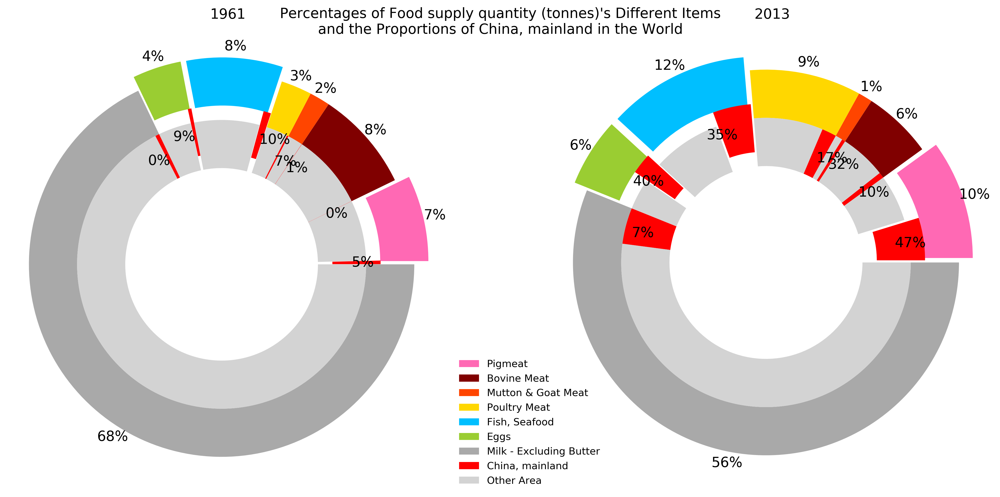

In [31]:
# 可以设置时间
pi_AG(D,A,E,years=[])

# 'Food supply quantity (g/capita/day)'

{'FoodSupply_LivestockFish': {'China, mainland': {'Food supply quantity (tonnes)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply quantity (g/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}}}}
['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'M

,1961,2013
Pigmeat,89.0,16.0
Bovine Meat,150.0,122.0
Mutton & Goat Meat,130.0,49.0
Poultry Meat,102.0,107.0
"Fish, Seafood",102.0,26.0
Eggs,71.0,3.0
Milk - Excluding Butter,144.0,130.0


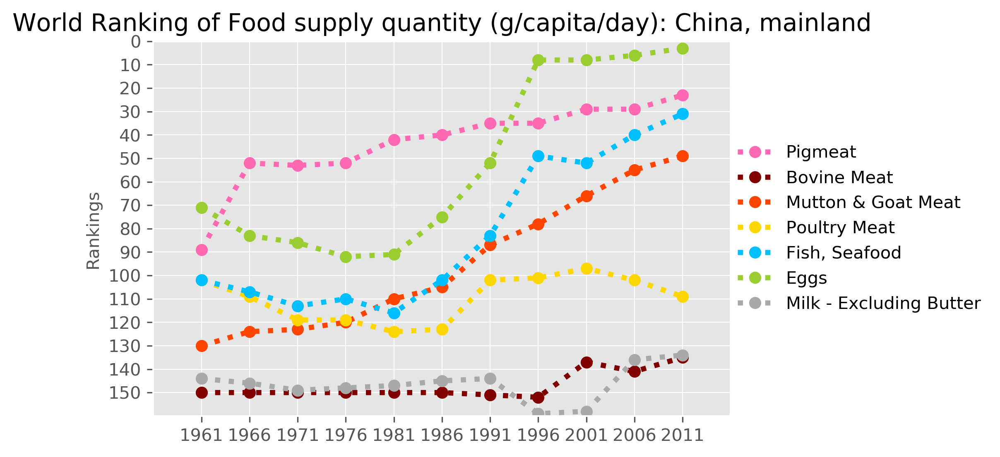

In [32]:
E = 'Food supply quantity (g/capita/day)'
toUnit = ''
changeUnit = 1

# 生成条件
CDTs[D][A][E] = Is
print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs[D]={}
PVs[D][A]={}
PVs[D][A][E] = mkPVs_Area_Year(D, A, E, IsGroup)

# for i, pv in PVs[D][A][E].items():
# #         print(Unit)
#     display(E, i, pv.tail(2))

# 根据需要设置items和颜色
ranking_AreaItemInWorld(D,A,E,rank_max=150)

items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,95.02,12.75,7.90,33.07,85.42,50.24,79.97
2010,97.84,13.13,8.12,33.47,88.10,50.33,83.78
2011,97.60,12.90,8.02,33.95,90.02,50.93,85.13
2012,102.91,13.14,8.21,35.81,95.01,51.42,88.94
2013,105.29,14.02,8.57,36.15,94.42,51.41,89.48


items = ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats']


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,151.77,85.42,50.24,79.97,8.21,5.36
2010,155.73,88.10,50.33,83.78,9.20,5.44
2011,155.75,90.02,50.93,85.13,9.41,5.73
2012,163.33,95.01,51.42,88.94,9.38,5.71
2013,167.27,94.42,51.41,89.48,9.43,5.49


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Meat, Other"
Year,,,,,
2009,95.02,12.75,7.90,33.07,3.03
2010,97.84,13.13,8.12,33.47,3.17
2011,97.60,12.90,8.02,33.95,3.28
2012,102.91,13.14,8.21,35.81,3.26
2013,105.29,14.02,8.57,36.15,3.23


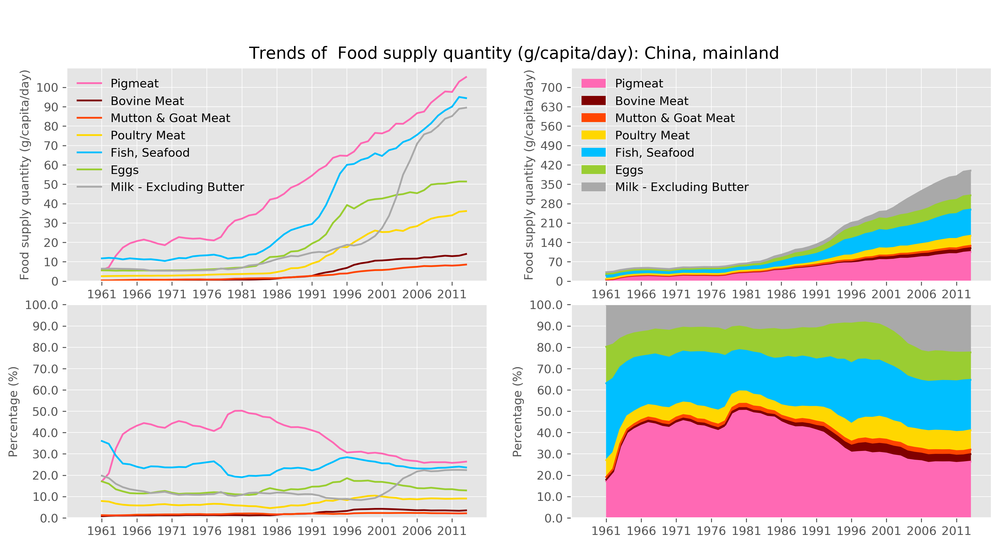

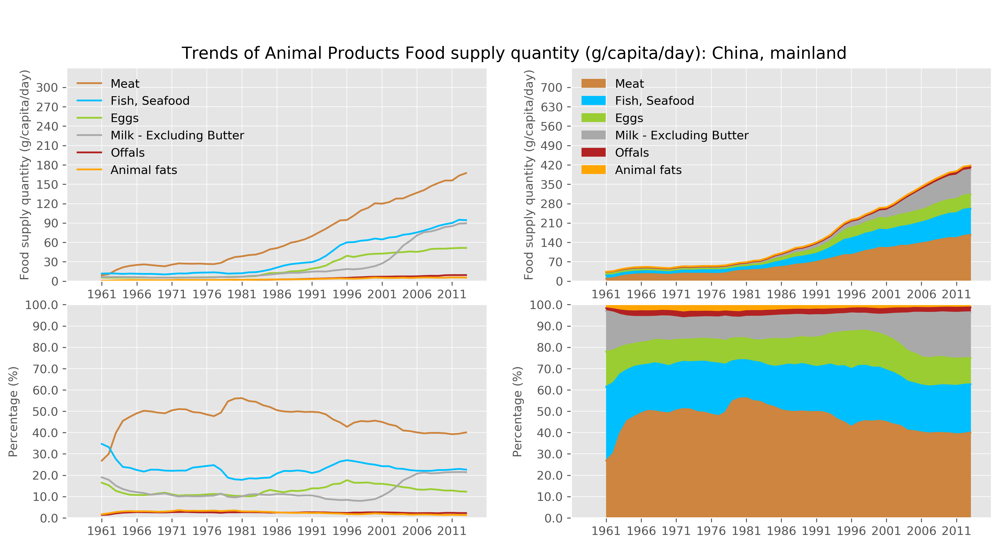

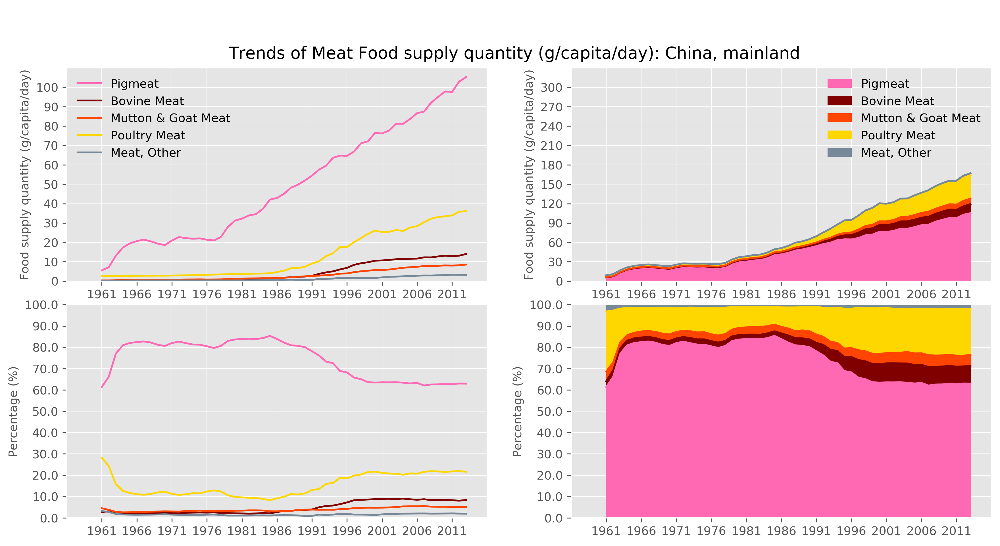

In [33]:
# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E)

# 可以观察pivot决定是否增设 items group, 并设置颜色

# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
          )
plotTrends(D, A, E, items_group='Meat', 
           colors=[cpig,ccattle,cgoat,cbirds,cother],
          )

,1993,2013
Area,,
"China, Macao SAR",117.15,195.83
"China, Hong Kong SAR",114.55,183.88
Montenegro,0.00,145.32
Austria,180.07,144.00
Germany,146.65,141.96
"China, mainland",59.54,105.29


Food supply quantity (g/capita/day), Pigmeat, 1993
Food supply quantity (g/capita/day), Pigmeat, 2013


,1993,2013
Area,,
Argentina,177.49,152.01
Brazil,76.67,107.52
United States of America,115.07,99.28
Australia,115.11,92.76
Bermuda,77.21,90.83
"China, mainland",4.52,14.02


Food supply quantity (g/capita/day), Bovine Meat, 1993
Food supply quantity (g/capita/day), Bovine Meat, 2013


,1993,2013
Area,,
Mongolia,130.27,125.00
Turkmenistan,33.42,69.86
Iceland,81.63,57.85
New Zealand,84.90,51.81
Kuwait,42.08,42.77
"China, mainland",3.10,8.57


Food supply quantity (g/capita/day), Mutton & Goat Meat, 1993
Food supply quantity (g/capita/day), Mutton & Goat Meat, 2013


,1993,2013
Area,,
Saint Vincent and the Grenadines,122.25,199.63
Saint Lucia,155.80,190.47
Samoa,68.95,174.81
Brunei Darussalam,83.32,172.26
Israel,124.11,171.23
"China, mainland",12.92,36.15


Food supply quantity (g/capita/day), Poultry Meat, 1993
Food supply quantity (g/capita/day), Poultry Meat, 2013


,1993,2013
Area,,
Maldives,449.80,506.53
Iceland,248.35,251.84
Kiribati,206.44,198.51
"China, Hong Kong SAR",165.89,191.33
Malaysia,133.82,161.56
"China, mainland",39.22,94.42


Food supply quantity (g/capita/day), Fish, Seafood, 1993
Food supply quantity (g/capita/day), Fish, Seafood, 2013


,1993,2013
Area,,
Japan,55.39,52.46
Paraguay,21.52,51.59
"China, mainland",24.16,51.41
Mexico,32.04,50.23
Ukraine,32.23,49.35


Food supply quantity (g/capita/day), Eggs, 1993
Food supply quantity (g/capita/day), Eggs, 2013


,1993,2013
Area,,
Finland,866.17,1180.16
Montenegro,0.00,956.74
Netherlands,851.78,935.54
Sweden,1011.95,934.88
Switzerland,926.39,873.13
"China, mainland",14.86,89.48


Food supply quantity (g/capita/day), Milk - Excluding Butter, 1993
Food supply quantity (g/capita/day), Milk - Excluding Butter, 2013


,1993,2013
Area,,
"China, Hong Kong SAR",285.41,419.50
"China, Macao SAR",230.94,327.27
Australia,303.58,318.45
United States of America,319.14,315.44
Argentina,270.08,293.82
"China, mainland",81.22,167.27


Food supply quantity (g/capita/day), Meat, 1993
Food supply quantity (g/capita/day), Meat, 2013


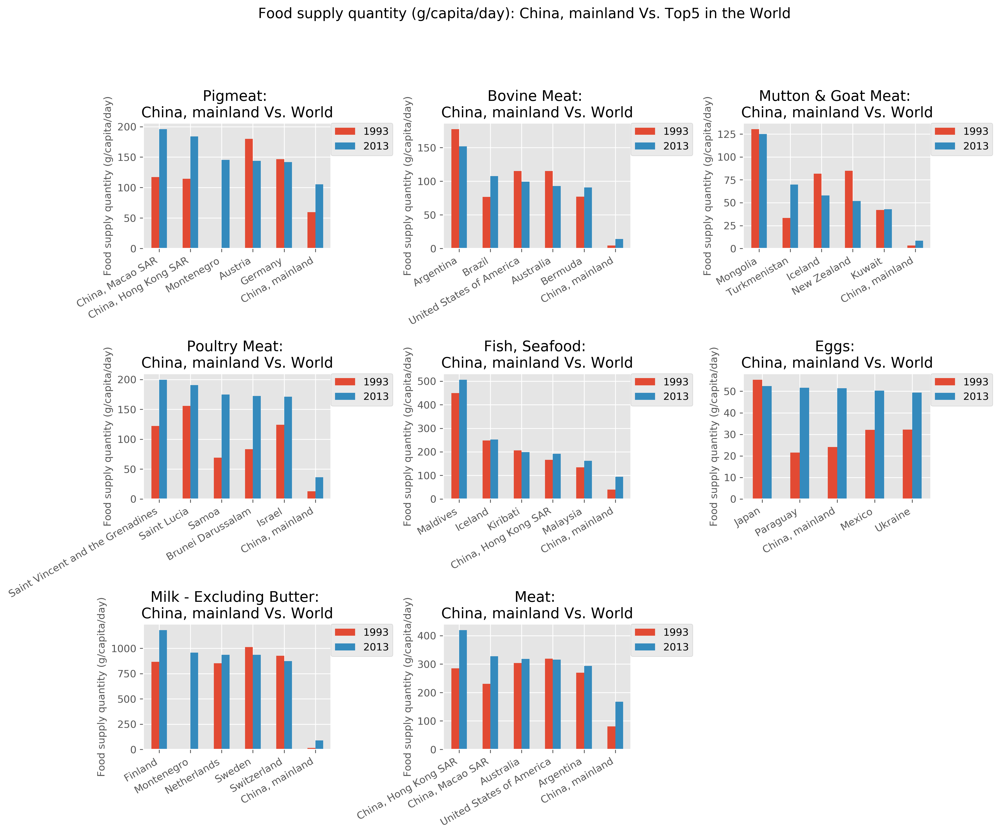

In [34]:
items=ITEMs.copy()
items.append('Meat')
mkDataMaps(D, A, E, items=items)

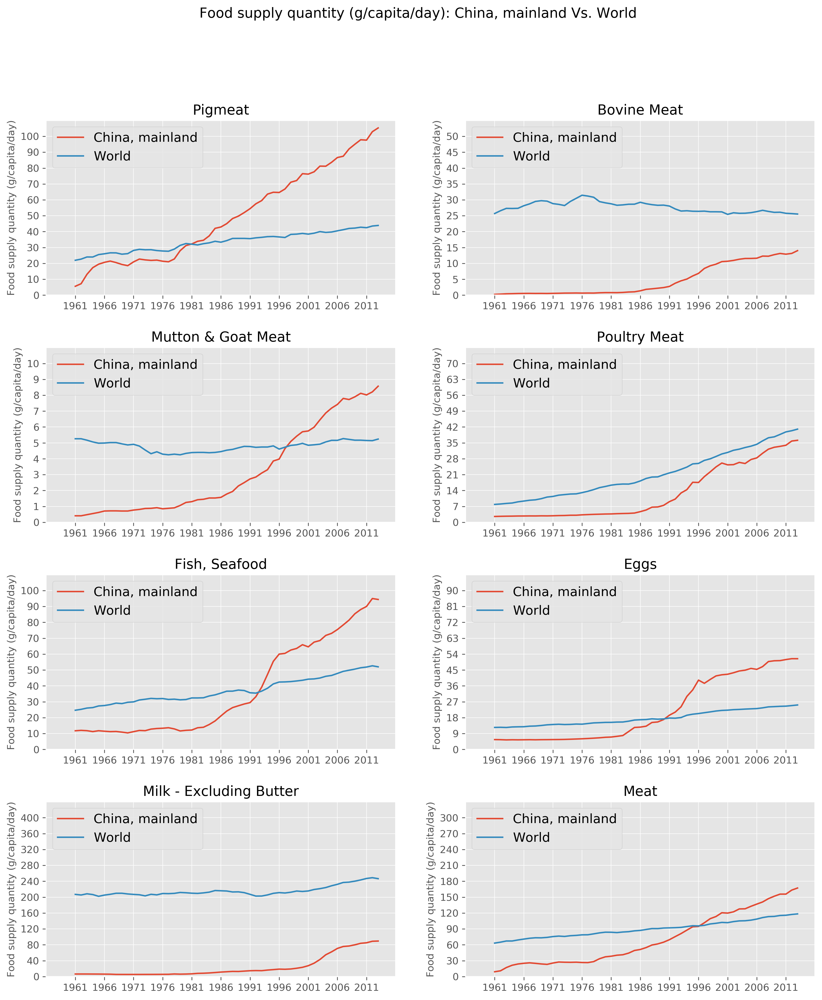

In [35]:
items=ITEMs.copy()
items.append('Meat')
proportion_AG(D,A,E, items=items, kind='line')

# pi_AG(D,A,E)

# 'Food supply (kcal/capita/day)'

{'FoodSupply_LivestockFish': {'China, mainland': {'Food supply quantity (tonnes)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply quantity (g/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply (kcal/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal P

,1961,2013
Grand Total,150.0,54.0
Animal Products,146.0,56.0
Meat,140.0,9.0
"Fish, Seafood",106.0,47.0
Eggs,70.0,2.0
Milk - Excluding Butter,138.0,130.0


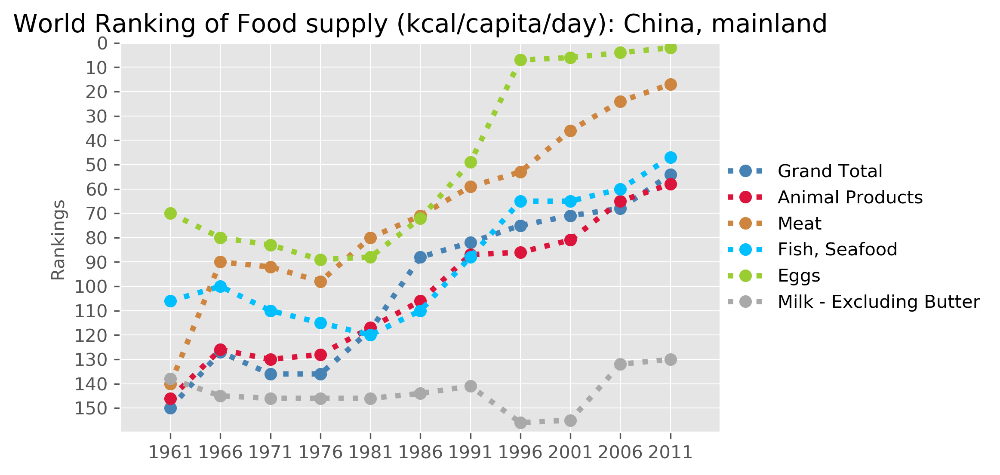

In [36]:
E = 'Food supply (kcal/capita/day)'
toUnit = ''
changeUnit = 1

# 生成条件
CDTs[D][A][E] = Is
print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs[D]={}
PVs[D][A]={}
PVs[D][A][E] = mkPVs_Area_Year(D, A, E, IsGroup)

# for i, pv in PVs[D][A][E].items():
# #         print(Unit)
#     display(E, i, pv.tail(2))

# 根据需要设置items和颜色
ctotal,canimal,cmeat='steelblue','crimson','peru'
ranking_AreaItemInWorld(
    D,A,E,
    items=['Grand Total','Animal Products','Meat','Fish, Seafood', 'Eggs', 'Milk - Excluding Butter'],
    colors=[ctotal,canimal,cmeat,cfish,cegg,cmilk],
    rank_max=150)

items = ['Grand Total', 'Animal Products']


,Grand Total,Animal Products
Year,,
2009,2994.0,668.0
2010,3044.0,687.0
2011,3081.0,690.0
2012,3100.0,715.0
2013,3108.0,724.0


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,338.0,26.0,16.0,57.0,46.0,74.0,53.0
2010,348.0,27.0,16.0,58.0,47.0,74.0,55.0
2011,346.0,27.0,16.0,59.0,48.0,75.0,56.0
2012,361.0,27.0,17.0,62.0,50.0,76.0,58.0
2013,369.0,28.0,17.0,63.0,50.0,76.0,58.0


items = ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats']


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,441.0,46.0,74.0,53.0,9.0,37.0
2010,454.0,47.0,74.0,55.0,10.0,37.0
2011,452.0,48.0,75.0,56.0,10.0,39.0
2012,471.0,50.0,76.0,58.0,10.0,39.0
2013,482.0,50.0,76.0,58.0,10.0,38.0


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Meat, Other"
Year,,,,,
2009,338.0,26.0,16.0,57.0,4.0
2010,348.0,27.0,16.0,58.0,4.0
2011,346.0,27.0,16.0,59.0,4.0
2012,361.0,27.0,17.0,62.0,4.0
2013,369.0,28.0,17.0,63.0,4.0


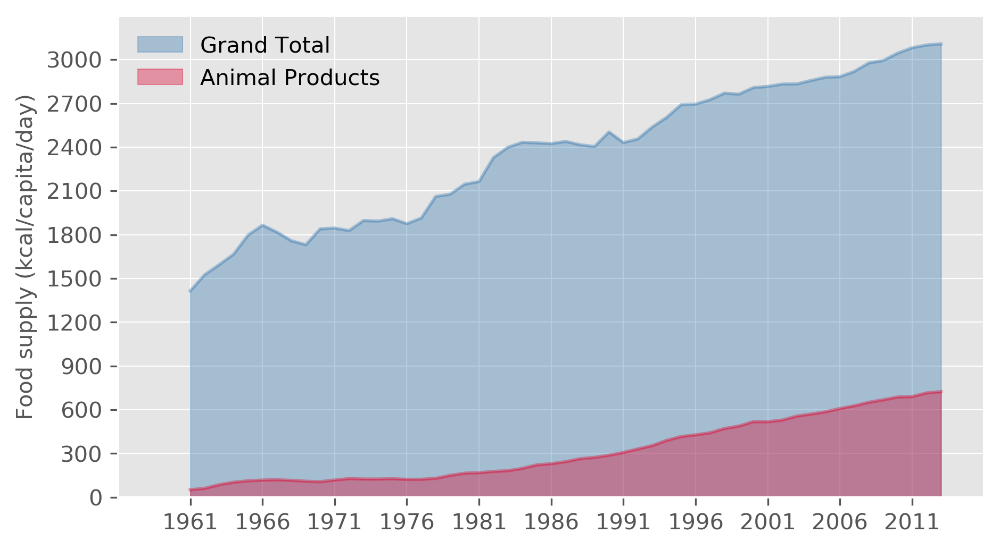

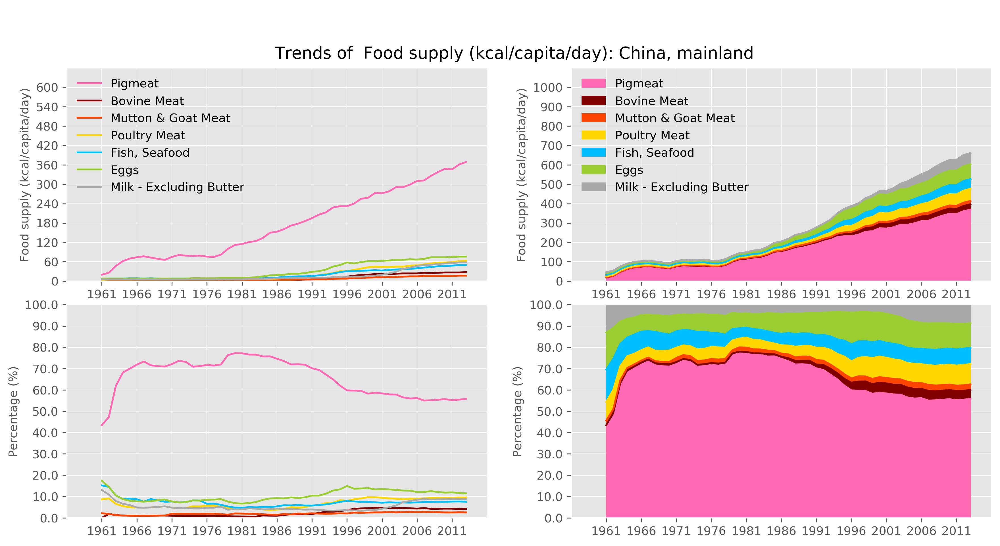

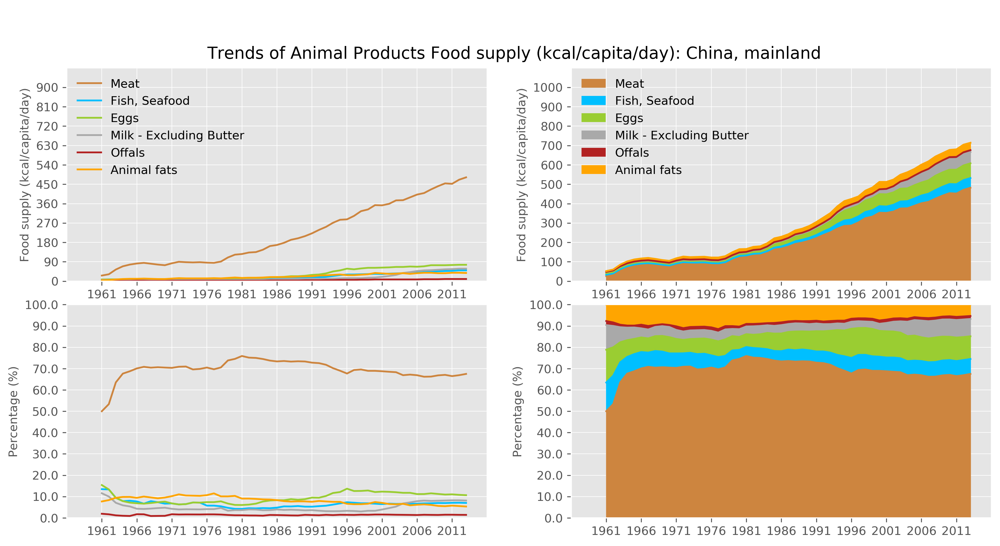

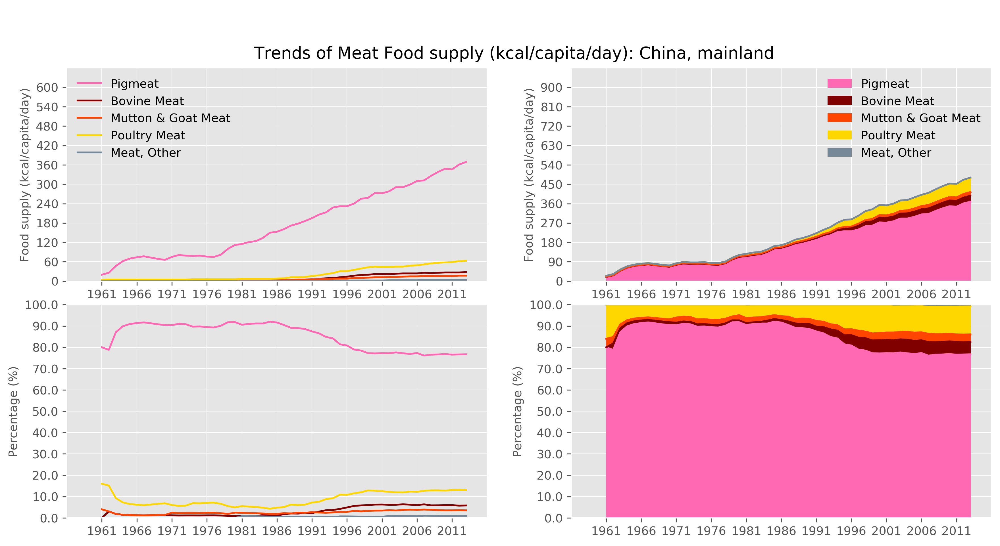

In [37]:
plotTrends(D, A, E, items_group='Grand Total', 
           toUnit='', changeUnit = 1,
           colors=[ctotal,canimal],
           stacked=False,
          )

# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E)

# 根据需要设置items和颜色


# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           toUnit='', changeUnit = 1,
           colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
          )
plotTrends(D, A, E, items_group='Meat', 
           toUnit='', changeUnit = 1,
           colors=[cpig,ccattle,cgoat,cbirds,cother],
          )

In [67]:
# mkDataMaps(D, A, E)

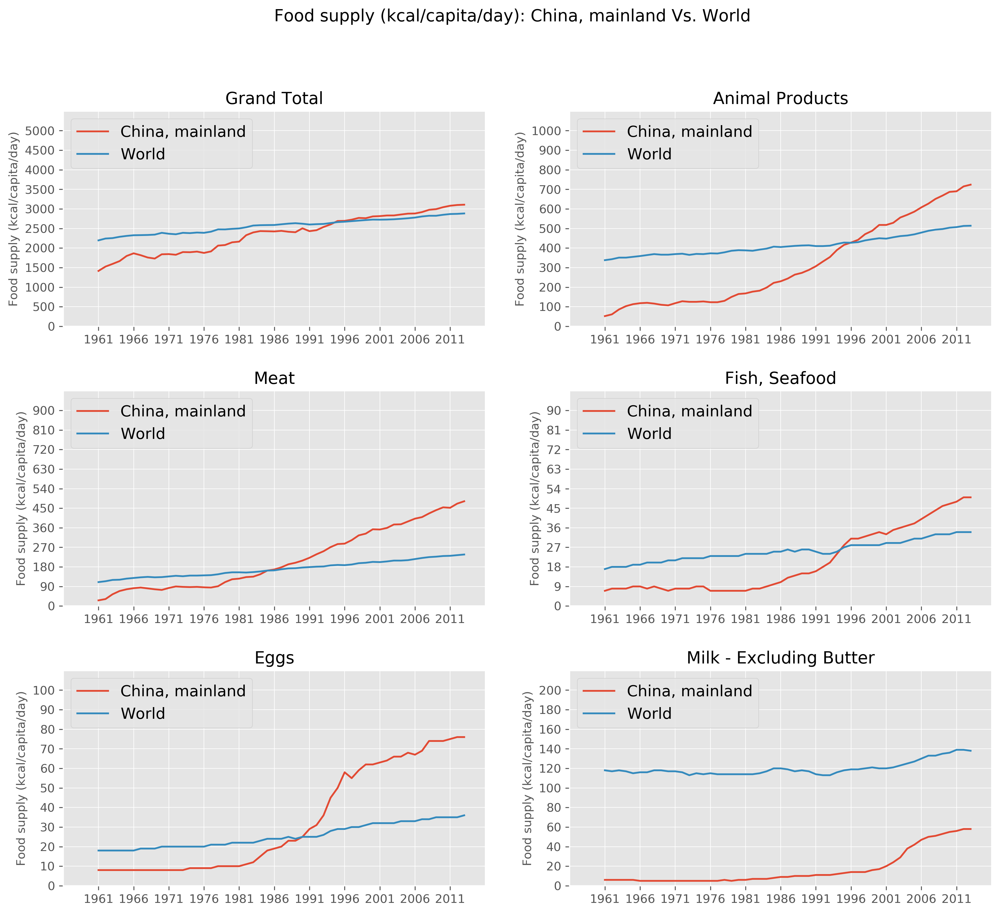

In [38]:
proportion_AG(
    D,A,E,
    items=['Grand Total','Animal Products','Meat','Fish, Seafood', 'Eggs', 'Milk - Excluding Butter'],
    kind='line',
)

# pi_AG(D,A,E)

# 'Protein supply quantity (g/capita/day)'

In [40]:
E = 'Protein supply quantity (g/capita/day)'
toUnit=''
changeUnit=1

# 生成条件
CDTs[D][A][E] = Is
print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs[D]={}
PVs[D][A]={}
PVs[D][A][E] = mkPVs_Area_Year(D, A, E, IsGroup)

# for i, pv in PVs[D][A][E].items():
# #         print(Unit)
#     display(E, i, pv.tail(2))

# # 根据需要设置items和颜色
# ranking_AreaItemInWorld(
#     D,A,E,
#     items=['Grand Total','Animal Products','Meat','Fish, Seafood', 'Eggs', 'Milk - Excluding Butter'],
#     colors=[ctotal,canimal,cmeat,cfish,cegg,cmilk],
#     rank_max=150)

{'FoodSupply_LivestockFish': {'China, mainland': {'Food supply quantity (tonnes)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply quantity (g/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply (kcal/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal P

items = ['Grand Total', 'Animal Products']


,Grand Total,Animal Products
Year,,
2009,92.63,36.06
2010,94.98,37.10
2011,95.64,37.45
2012,97.37,38.85
2013,98.02,39.28


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,10.51,1.75,1.08,3.89,7.63,5.76,2.76
2010,10.82,1.80,1.12,3.94,7.84,5.77,2.89
2011,10.78,1.77,1.10,3.99,8.04,5.84,2.92
2012,11.32,1.80,1.13,4.23,8.38,5.89,3.04
2013,11.58,1.92,1.18,4.26,8.33,5.89,3.07


items = ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats']


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,17.78,7.63,5.76,2.76,1.46,0.00
2010,18.25,7.84,5.77,2.89,1.64,0.00
2011,18.24,8.04,5.84,2.92,1.68,0.01
2012,19.06,8.38,5.89,3.04,1.68,0.01
2013,19.52,8.33,5.89,3.07,1.69,0.01


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Meat, Other"
Year,,,,,
2009,10.51,1.75,1.08,3.89,0.54
2010,10.82,1.80,1.12,3.94,0.57
2011,10.78,1.77,1.10,3.99,0.59
2012,11.32,1.80,1.13,4.23,0.58
2013,11.58,1.92,1.18,4.26,0.58


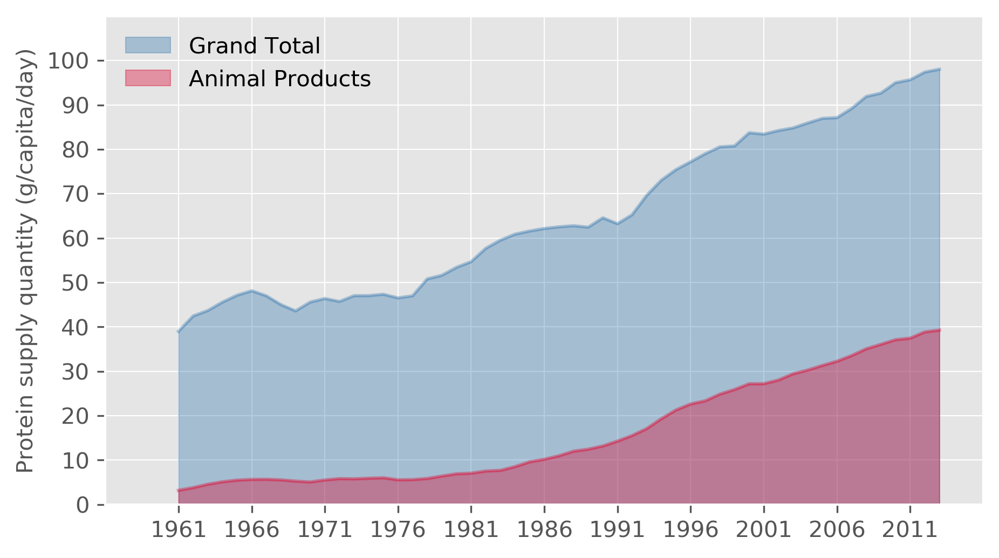

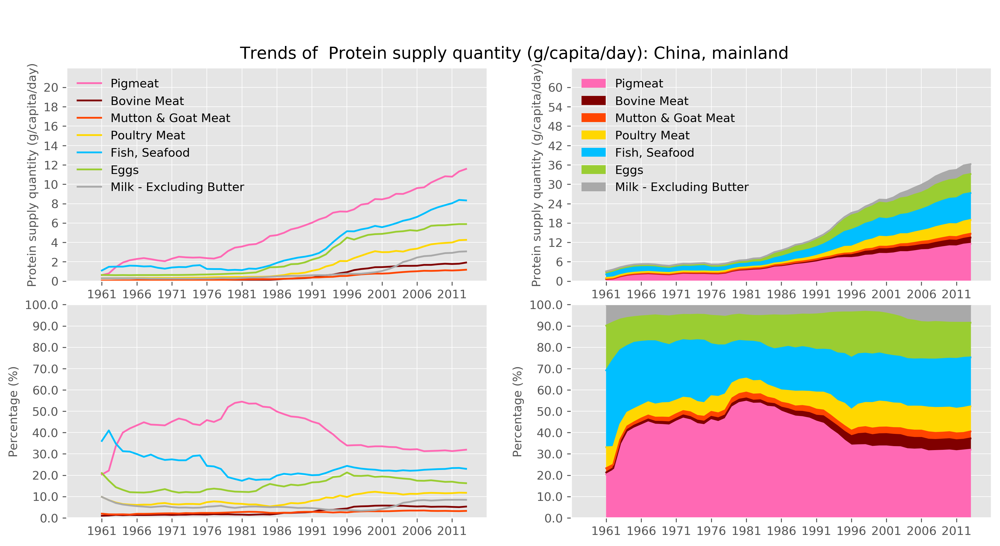

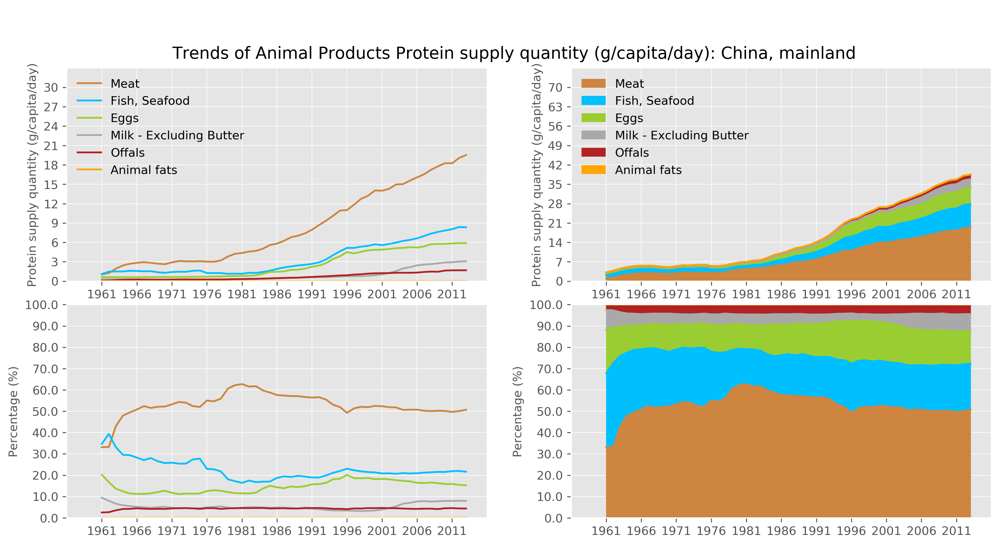

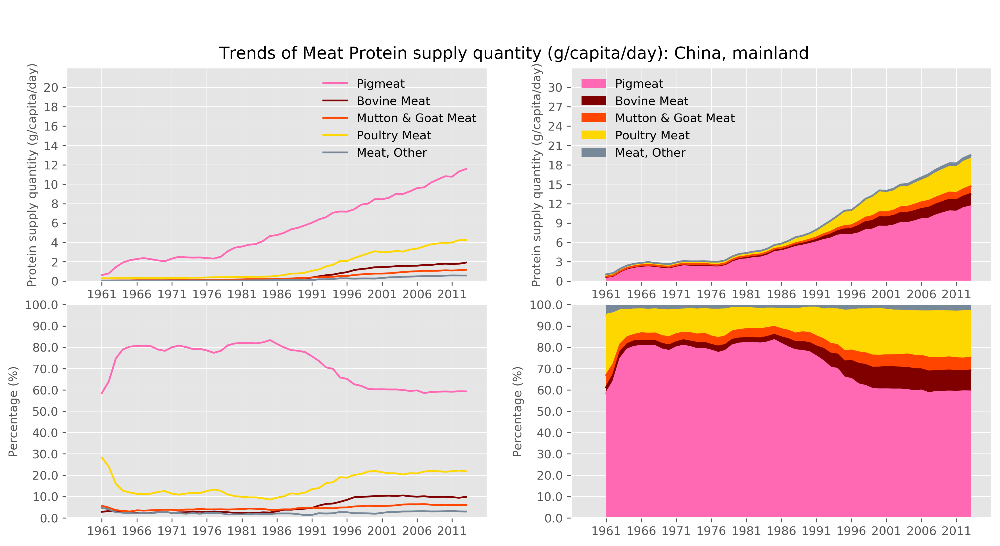

In [41]:
plotTrends(D, A, E, items_group='Grand Total', 
           toUnit='', changeUnit = 1,
           colors=[ctotal,canimal],
           stacked=False,
          )

# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E)

# 根据需要设置items和颜色


# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           toUnit='', changeUnit = 1,
           colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
          )
plotTrends(D, A, E, items_group='Meat', 
           toUnit='', changeUnit = 1,
           colors=[cpig,ccattle,cgoat,cbirds,cother],
          )

In [42]:
# mkDataMaps(D, A, E)

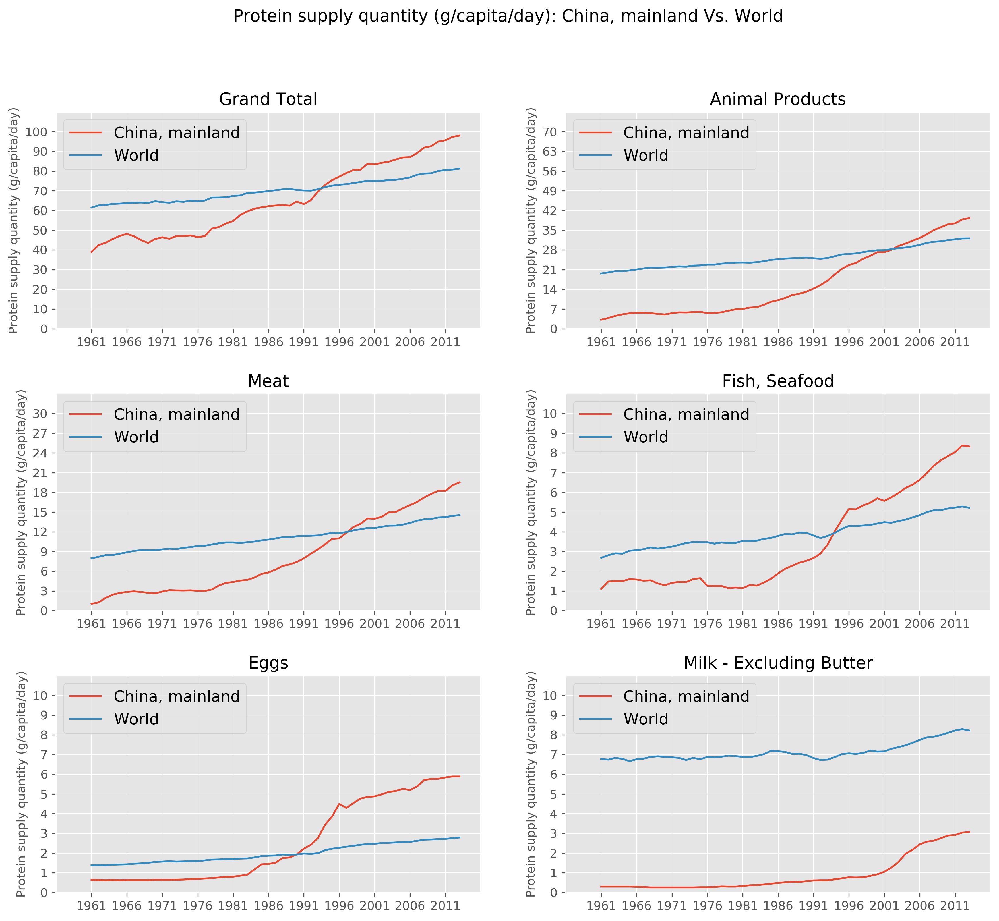

In [43]:
proportion_AG(
    D,A,E,
    items=['Grand Total','Animal Products','Meat','Fish, Seafood', 'Eggs', 'Milk - Excluding Butter'],
    kind='line',
)

# pi_AG(D,A,E)

# 'Fat supply quantity (g/capita/day)'

{'FoodSupply_LivestockFish': {'China, mainland': {'Food supply quantity (tonnes)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply quantity (g/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal Products': ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats'], 'Meat': ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other'], 'Pigmeat': [], 'Bovine Meat': [], 'Mutton & Goat Meat': [], 'Poultry Meat': [], 'Fish, Seafood': [], 'Eggs': [], 'Milk - Excluding Butter': []}, 'Food supply (kcal/capita/day)': {'Grand Total': ['Grand Total', 'Animal Products'], 'Animal P

,1961,2013
Grand Total,149.0,59.0
Animal Products,138.0,42.0
Meat,134.0,6.0
"Fish, Seafood",107.0,66.0
Eggs,65.0,1.0
Milk - Excluding Butter,132.0,127.0


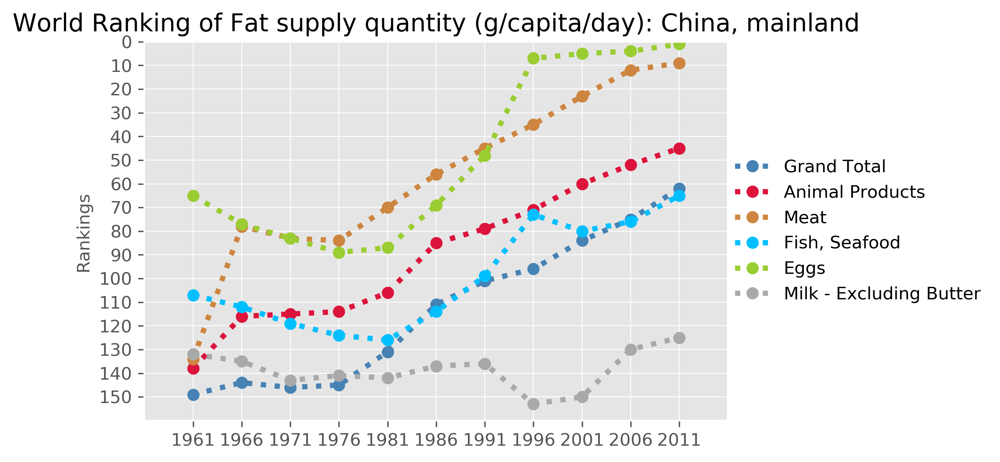

In [45]:
E = 'Fat supply quantity (g/capita/day)'
toUnit=''
changeUnit=1

# 生成条件
CDTs[D][A][E] = Is
print(CDTs)

# 生成主要末梢 (所有空值键 + 自定义键)
items = []
for i in CDTs[D][A][E]:
    if CDTs[D][A][E][i]==[]: items.append(i)
ITEMs=items
print(ITEMs)

# 设置 items group, 自动生成最终的 ITEMs
ITEMs_all = ranking_ItemInArea(D,A,E,IsGroup)
print(ITEMs_all)
items = []
for i in ITEMs:
    if i in ITEMs_all: items.append(i)
ITEMs=items
print(ITEMs)

PVs[D]={}
PVs[D][A]={}
PVs[D][A][E] = mkPVs_Area_Year(D, A, E, IsGroup)

# for i, pv in PVs[D][A][E].items():
# #         print(Unit)
#     display(E, i, pv.tail(2))

# 根据需要设置items和颜色
ranking_AreaItemInWorld(
    D,A,E,
    items=['Grand Total','Animal Products','Meat','Fish, Seafood', 'Eggs', 'Milk - Excluding Butter'],
    colors=[ctotal,canimal,cmeat,cfish,cegg,cmilk],
    rank_max=150)

items = ['Grand Total', 'Animal Products']


,Grand Total,Animal Products
Year,,
2009,91.11,54.45
2010,93.14,55.86
2011,93.19,56.06
2012,94.79,57.97
2013,95.12,58.74


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter
Year,,,,,,,
2009,32.46,2.10,1.27,4.48,1.31,5.27,3.00
2010,33.41,2.17,1.29,4.57,1.35,5.28,3.13
2011,33.22,2.13,1.28,4.66,1.39,5.34,3.14
2012,34.64,2.16,1.31,4.90,1.43,5.39,3.25
2013,35.41,2.25,1.38,4.94,1.42,5.39,3.22


items = ['Meat', 'Fish, Seafood', 'Eggs', 'Milk - Excluding Butter', 'Offals', 'Animal fats']


,Meat,"Fish, Seafood",Eggs,Milk - Excluding Butter,Offals,Animal fats
Year,,,,,,
2009,40.46,1.31,5.27,3.00,0.28,4.08
2010,41.60,1.35,5.28,3.13,0.32,4.14
2011,41.44,1.39,5.34,3.14,0.32,4.38
2012,43.16,1.43,5.39,3.25,0.32,4.37
2013,44.13,1.42,5.39,3.22,0.33,4.21


items = ['Pigmeat', 'Bovine Meat', 'Mutton & Goat Meat', 'Poultry Meat', 'Meat, Other']


,Pigmeat,Bovine Meat,Mutton & Goat Meat,Poultry Meat,"Meat, Other"
Year,,,,,
2009,32.46,2.10,1.27,4.48,0.15
2010,33.41,2.17,1.29,4.57,0.15
2011,33.22,2.13,1.28,4.66,0.16
2012,34.64,2.16,1.31,4.90,0.16
2013,35.41,2.25,1.38,4.94,0.16


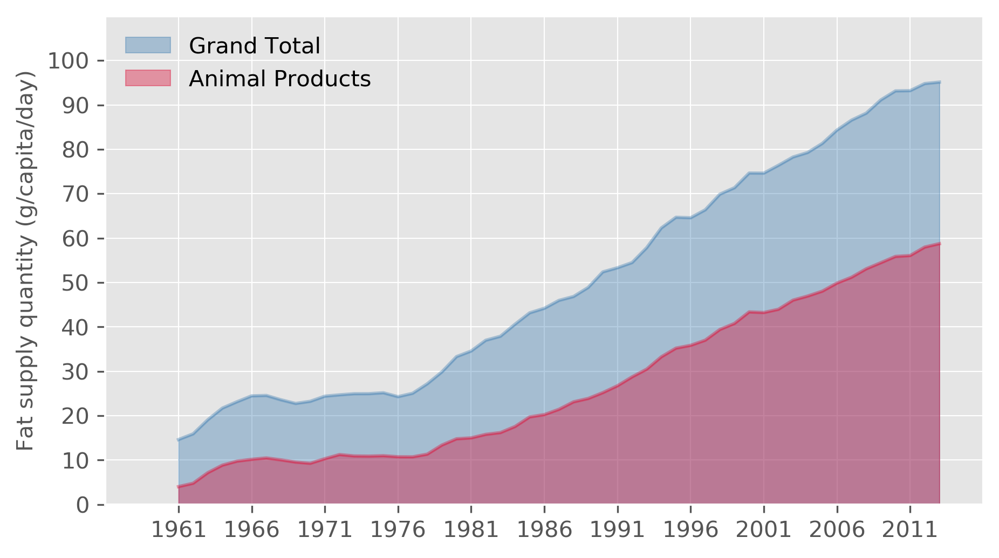

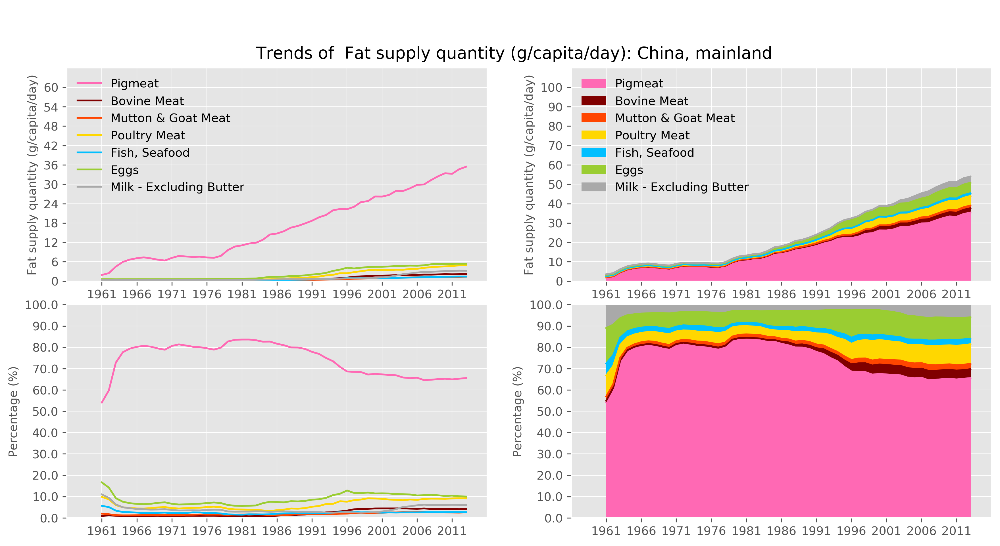

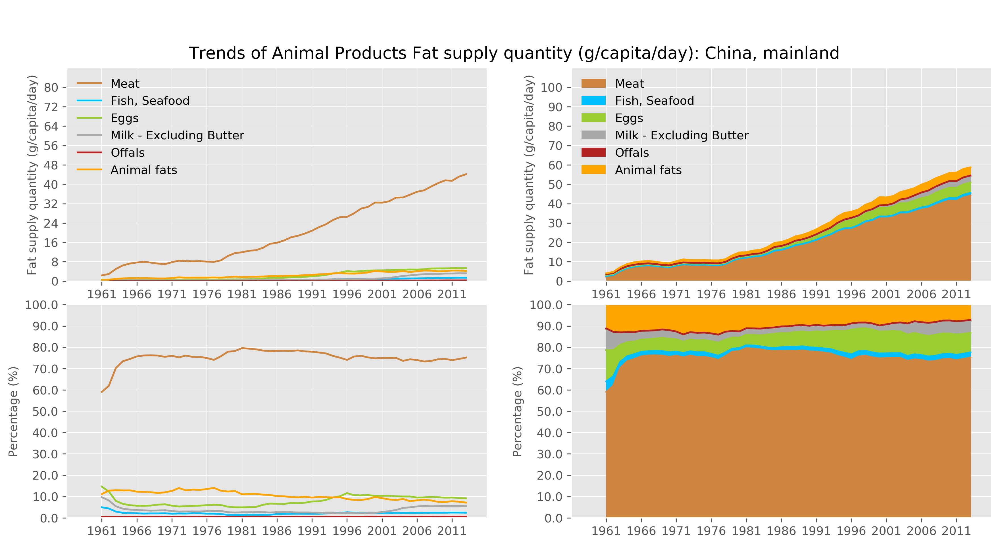

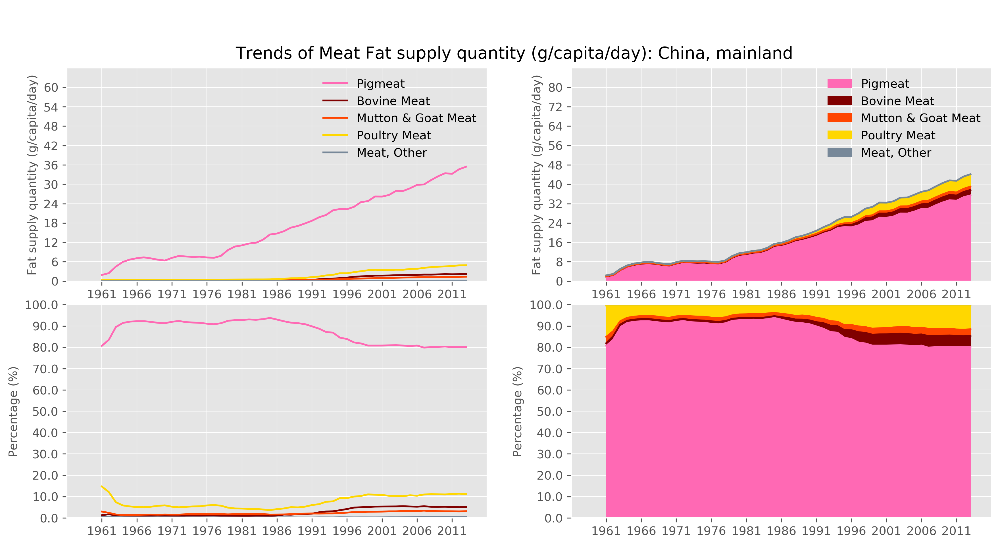

In [46]:
plotTrends(D, A, E, items_group='Grand Total', 
           toUnit='', changeUnit = 1,
           colors=[ctotal,canimal],
           stacked=False,
          )

# 所有主要末梢类别, 加上末梢不重要但总类重要的总类
plotTrends(D, A, E)

# 根据需要设置items和颜色


# 重要总类的分类
plotTrends(D, A, E, items_group='Animal Products', 
           toUnit='', changeUnit = 1,
           colors=[cmeat,cfish,cegg,cmilk,coffal,cfat],
          )
plotTrends(D, A, E, items_group='Meat', 
           toUnit='', changeUnit = 1,
           colors=[cpig,ccattle,cgoat,cbirds,cother],
          )

In [47]:
# mkDataMaps(D, A, E)

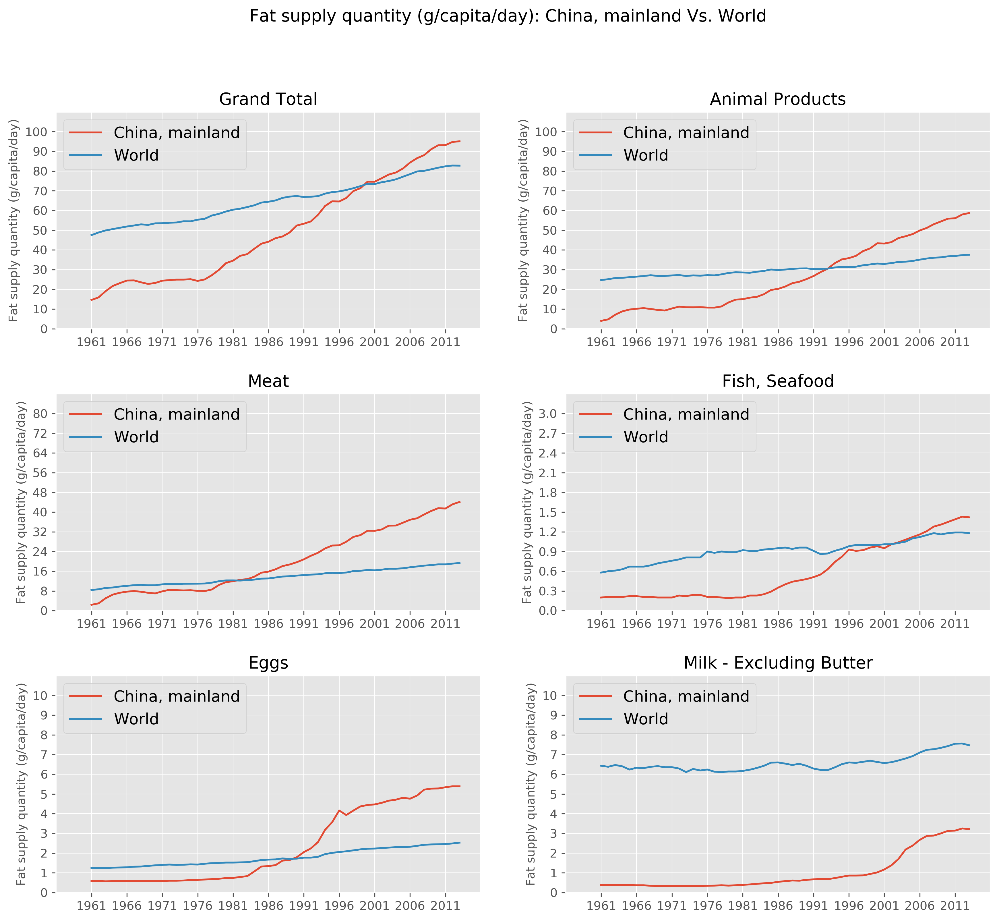

In [48]:
proportion_AG(
    D,A,E,
    items=['Grand Total','Animal Products','Meat','Fish, Seafood', 'Eggs', 'Milk - Excluding Butter'],
    kind='line',
)

# pi_AG(D,A,E)